# SegNet  
- Pytorch로 논문 구현  
- Data: CamVid (from Kaggle)
    - Train: 369개, Valid: 100개, Test: 232개
    
- accuracy를 측정할 metric으로는 mIoU score와 BF score를 사용

# Packages and Modules

In [1]:
# packages and modules
import os
import time
import cv2
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from torch.optim.lr_scheduler import CosineAnnealingWarmRestarts, ReduceLROnPlateau, StepLR, MultiStepLR, CyclicLR, CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader
from torchsummary import summary

from pytorchtools import EarlyStopping, CheckPoint, Metrics, FocalLoss
from segnet_utils import load_image_with_resize

In [2]:
warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.figsize'] = [10,7]

# Load Data

In [3]:
# 클래스 디렉토리 데이터 불러오기
data = pd.read_csv('./camvid/11_class_dict.csv', index_col=0)
data

,r,g,b
name,,,
Sky,128,128,128
Building,128,0,0
Pole,192,192,128
Road,128,64,128
Sidewalk,0,0,192
Tree,128,128,0
SignSymbol,192,128,128
Fence,64,64,128
Car,64,0,128


In [4]:
rgb_data = {name:list(data.loc[name, :]) for name in data.index}
rgb_array = {idx:np.array(rgb) for idx, (_, rgb) in enumerate(rgb_data.items())}

In [5]:
width = 224
height = 224
num_classes = len(data) # 12 classes (11 object classes and 1 background class)

# cuda setting
device = torch.device('cuda')
print(device)

cuda


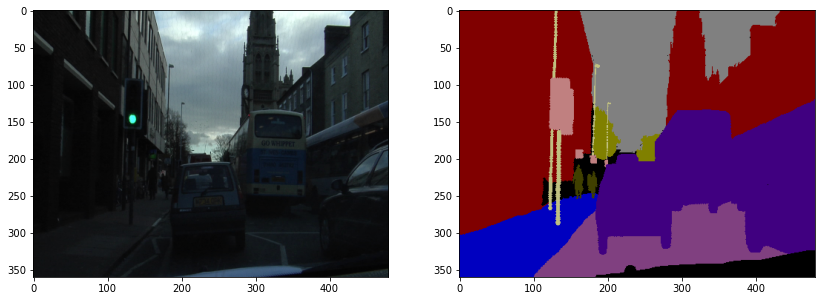

In [6]:
# show sample image
ex1 = Image.open('./camvid/train/train_images/0001TP_006690.png')
ex2 = Image.open('./camvid/train/train_labels/0001TP_006690_L.png')
plt.figure(figsize=(14,6))
plt.subplot(121)
plt.imshow(ex1)
plt.subplot(122)
plt.imshow(ex2)
plt.show()

In [7]:
# load image data with resize
path = './camvid/'
train_image, train_label = load_image_with_resize(path, 
                                                  n_pixel_L=width, n_pixel_R=height, 
                                                  subset='train')
valid_image, valid_label = load_image_with_resize(path, 
                                                  n_pixel_L=width, n_pixel_R=height, 
                                                  subset='valid')
test_image, test_label = load_image_with_resize(path, 
                                                n_pixel_L=width, n_pixel_R=height, 
                                                subset='test')

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/367 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

  0%|          | 0/233 [00:00<?, ?it/s]

In [8]:
# image to 12 classes mask
def image2mask(labels):
    semantic_map = []
    for color in tqdm(list(rgb_data.values())):
        equality = np.equal(labels, color)
        class_map = np.all(equality, axis=-1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)
    return np.float32(semantic_map)

train_mask = image2mask(train_label)
valid_mask = image2mask(valid_label)
test_mask = image2mask(test_label)

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

In [9]:
# custom data set
class CamVidDataset(Dataset):
    def __init__(self, transforms_, subset='train', predict_train=False):
        self.transforms = transforms.Compose(transforms_)
        if subset=='train':
            if predict_train:
                self.images = train_image[:100]
                self.labels = train_mask[:100]
            else:
                self.images = train_image
                self.labels = train_mask
        elif subset=='valid':
            self.images = valid_image
            self.labels = valid_mask
        else:
            self.images = test_image
            self.labels = test_mask
            
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        images = self.images[idx]
        labels = self.labels[idx]
        return self.transforms(images), self.transforms(labels)

In [10]:
batch_size = 12

transforms_ = [
    transforms.ToTensor(),
]

train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train'),
    batch_size=batch_size,
    shuffle=True,
    drop_last=True
)

valid_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='valid'),
    batch_size=len(valid_image),
    shuffle=True,
    drop_last=True
)

## Build Model

In [11]:
class EncoderBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(EncoderBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_dim, out_dim, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU(),
        )
        self._init_weight_()
        
    def forward(self, x):
        return self.block(x)
    
    def _init_weight_(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal(m.weight)
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

In [12]:
class DecoderBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(DecoderBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose2d(in_dim, out_dim, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_dim),
            nn.ReLU(),
        )
        self._init_weight_()
        
    def forward(self, x):
        return self.block(x)
    
    def _init_weight_(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.kaiming_normal(m.weight)
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

In [13]:
class SegNet(nn.Module):
    def __init__(self, in_dim=3, out_dim=num_classes, num_filters=64):
        super(SegNet, self).__init__()
        
        self.vgg16 = models.vgg16(pretrained=True)
        
        self.MaxPooling = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        
        self.encoder1 = EncoderBlock(in_dim, num_filters)
        self.encoder2 = EncoderBlock(num_filters, num_filters)
        
        self.encoder3 = EncoderBlock(num_filters, num_filters*2)
        self.encoder4 = EncoderBlock(num_filters*2, num_filters*2)
        
        self.encoder5 = EncoderBlock(num_filters*2, num_filters*4)
        self.encoder6 = EncoderBlock(num_filters*4, num_filters*4)
        self.encoder7 = EncoderBlock(num_filters*4, num_filters*4)
        
        self.encoder8 = EncoderBlock(num_filters*4, num_filters*8)
        self.encoder9 = EncoderBlock(num_filters*8, num_filters*8)
        self.encoder10 = EncoderBlock(num_filters*8, num_filters*8)
        
        self.encoder11 = EncoderBlock(num_filters*8, num_filters*8)
        self.encoder12 = EncoderBlock(num_filters*8, num_filters*8)
        self.encoder13 = EncoderBlock(num_filters*8, num_filters*8)
        
        self.get_vgg_weigts()
        
        
        self.UnMaxPooling = nn.MaxUnpool2d(kernel_size=2, stride=2)
        
        self.decoder1 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder2 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder3 = DecoderBlock(num_filters*8, num_filters*8)
        
        self.decoder4 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder5 = DecoderBlock(num_filters*8, num_filters*8)
        self.decoder6 = DecoderBlock(num_filters*8, num_filters*4)
        
        self.decoder7 = DecoderBlock(num_filters*4, num_filters*4)
        self.decoder8 = DecoderBlock(num_filters*4, num_filters*4)
        self.decoder9 = DecoderBlock(num_filters*4, num_filters*2)
        
        self.decoder10 = DecoderBlock(num_filters*2, num_filters*2)
        self.decoder11 = DecoderBlock(num_filters*2, num_filters)
        
        self.decoder12 = DecoderBlock(num_filters, num_filters)
        self.decoder13 = DecoderBlock(num_filters, out_dim)
        
    def forward(self, x):

        size1 = x.size()
        x = self.encoder1(x)
        x = self.encoder2(x)
        x, idx1 = self.MaxPooling(x)

        size2 = x.size()
        x = self.encoder3(x)
        x = self.encoder4(x)
        x, idx2 = self.MaxPooling(x)

        size3 = x.size()
        x = self.encoder5(x)
        x = self.encoder6(x)
        x = self.encoder7(x)
        x, idx3 = self.MaxPooling(x)

        size4 = x.size()
        x = self.encoder8(x)
        x = self.encoder9(x)
        x = self.encoder10(x)
        x, idx4 = self.MaxPooling(x)

        size5 = x.size()
        x = self.encoder11(x)
        x = self.encoder12(x)
        x = self.encoder13(x)
        x, idx5 = self.MaxPooling(x)

        
        x = self.UnMaxPooling(x, idx5, output_size=size5)
        x = self.decoder1(x)
        x = self.decoder2(x)
        x = self.decoder3(x)

        x = self.UnMaxPooling(x, idx4, output_size=size4)
        x = self.decoder4(x)
        x = self.decoder5(x)
        x = self.decoder6(x)

        x = self.UnMaxPooling(x, idx3, output_size=size3)
        x = self.decoder7(x)
        x = self.decoder8(x)
        x = self.decoder9(x)

        x = self.UnMaxPooling(x, idx2, output_size=size2)
        x = self.decoder10(x)
        x = self.decoder11(x)

        x = self.UnMaxPooling(x, idx1, output_size=size1)
        x = self.decoder12(x)
        out = self.decoder13(x)
        
        return out
    
    def get_vgg_weigts(self):
        assert self.encoder1.block[0].weight.size() == self.vgg16.features[0].weight.size()
        self.encoder1.block[0].weight.data = self.vgg16.features[0].weight.data
        assert self.encoder1.block[0].bias.size() == self.vgg16.features[0].bias.size()
        self.encoder1.block[0].bias.data = self.vgg16.features[0].bias.data

        assert self.encoder2.block[0].weight.size() == self.vgg16.features[2].weight.size()
        self.encoder2.block[0].weight.data = self.vgg16.features[2].weight.data
        assert self.encoder2.block[0].bias.size() == self.vgg16.features[2].bias.size()
        self.encoder2.block[0].bias.data = self.vgg16.features[2].bias.data

        assert self.encoder3.block[0].weight.size() == self.vgg16.features[5].weight.size()
        self.encoder3.block[0].weight.data = self.vgg16.features[5].weight.data
        assert self.encoder3.block[0].bias.size() == self.vgg16.features[5].bias.size()
        self.encoder3.block[0].bias.data = self.vgg16.features[5].bias.data

        assert self.encoder4.block[0].weight.size() == self.vgg16.features[7].weight.size()
        self.encoder4.block[0].weight.data = self.vgg16.features[7].weight.data
        assert self.encoder4.block[0].bias.size() == self.vgg16.features[7].bias.size()
        self.encoder4.block[0].bias.data = self.vgg16.features[7].bias.data

        assert self.encoder5.block[0].weight.size() == self.vgg16.features[10].weight.size()
        self.encoder5.block[0].weight.data = self.vgg16.features[10].weight.data
        assert self.encoder5.block[0].bias.size() == self.vgg16.features[10].bias.size()
        self.encoder5.block[0].bias.data = self.vgg16.features[10].bias.data

        assert self.encoder6.block[0].weight.size() == self.vgg16.features[12].weight.size()
        self.encoder6.block[0].weight.data = self.vgg16.features[12].weight.data
        assert self.encoder6.block[0].bias.size() == self.vgg16.features[12].bias.size()
        self.encoder6.block[0].bias.data = self.vgg16.features[12].bias.data

        assert self.encoder7.block[0].weight.size() == self.vgg16.features[14].weight.size()
        self.encoder7.block[0].weight.data = self.vgg16.features[14].weight.data
        assert self.encoder7.block[0].bias.size() == self.vgg16.features[14].bias.size()
        self.encoder7.block[0].bias.data = self.vgg16.features[14].bias.data

        assert self.encoder8.block[0].weight.size() == self.vgg16.features[17].weight.size()
        self.encoder8.block[0].weight.data = self.vgg16.features[17].weight.data
        assert self.encoder8.block[0].bias.size() == self.vgg16.features[17].bias.size()
        self.encoder8.block[0].bias.data = self.vgg16.features[17].bias.data

        assert self.encoder9.block[0].weight.size() == self.vgg16.features[19].weight.size()
        self.encoder9.block[0].weight.data = self.vgg16.features[19].weight.data
        assert self.encoder9.block[0].bias.size() == self.vgg16.features[19].bias.size()
        self.encoder9.block[0].bias.data = self.vgg16.features[19].bias.data

        assert self.encoder10.block[0].weight.size() == self.vgg16.features[21].weight.size()
        self.encoder10.block[0].weight.data = self.vgg16.features[21].weight.data
        assert self.encoder10.block[0].bias.size() == self.vgg16.features[21].bias.size()
        self.encoder10.block[0].bias.data = self.vgg16.features[21].bias.data

        assert self.encoder11.block[0].weight.size() == self.vgg16.features[24].weight.size()
        self.encoder11.block[0].weight.data = self.vgg16.features[24].weight.data
        assert self.encoder11.block[0].bias.size() == self.vgg16.features[24].bias.size()
        self.encoder11.block[0].bias.data = self.vgg16.features[24].bias.data

        assert self.encoder12.block[0].weight.size() == self.vgg16.features[26].weight.size()
        self.encoder12.block[0].weight.data = self.vgg16.features[26].weight.data
        assert self.encoder12.block[0].bias.size() == self.vgg16.features[26].bias.size()
        self.encoder12.block[0].bias.data = self.vgg16.features[26].bias.data

        assert self.encoder13.block[0].weight.size() == self.vgg16.features[28].weight.size()
        self.encoder13.block[0].weight.data = self.vgg16.features[28].weight.data
        assert self.encoder13.block[0].bias.size() == self.vgg16.features[28].bias.size()
        self.encoder13.block[0].bias.data = self.vgg16.features[28].bias.data

In [14]:
model = SegNet().to(device)
summary(model, (3,224,224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
      EncoderBlock-4         [-1, 64, 224, 224]               0
            Conv2d-5         [-1, 64, 224, 224]          36,928
       BatchNorm2d-6         [-1, 64, 224, 224]             128
              ReLU-7         [-1, 64, 224, 224]               0
      EncoderBlock-8         [-1, 64, 224, 224]               0
         MaxPool2d-9  [[-1, 64, 112, 112], [-1, 64, 112, 112]]               0
           Conv2d-10        [-1, 128, 112, 112]          73,856
      BatchNorm2d-11        [-1, 128, 112, 112]             256
             ReLU-12        [-1, 128, 112, 112]               0
     EncoderBlock-13        [-1, 128, 112, 112]               0
           Conv2d-14    

# Median Frequency Balancing

In [15]:
# class balance of train data set 
train_class_labels = list(rgb_data.keys())
print(train_class_labels)

['Sky', 'Building', 'Pole', 'Road', 'Sidewalk', 'Tree', 'SignSymbol', 'Fence', 'Car', 'Pedestrian', 'Bicyclist', 'unlabelled']


In [16]:
# median frequency balancing
train_class_count = [2925992, 4164714, 113525, 5769970, 771679, 1666212, 191065, 195738,
                     1040037, 97657, 48378, 607456]
weights = torch.tensor(train_class_count, dtype=torch.float32)
median_weights = weights.median()
median_frequency_balancing = median_weights/weights
print(median_frequency_balancing)

tensor([ 0.2076,  0.1459,  5.3509,  0.1053,  0.7872,  0.3646,  3.1793,  3.1034,
         0.5841,  6.2203, 12.5565,  1.0000])


# Set Loss function, Optimizer, learning rate scheduler and early stopping  

**class imbalance problem**  
- using median frequency balancing  
$$weight = freq\, median \,/\, freq(c)$$  

**loss function**
- loss : weighted cross entropy loss
$$CE = -\sum y_{true}\log\left({y_{pred}}\right)$$  
$$Weighted\,CE = -\sum w\times y_{true}\log\left({y_{pred}}\right)$$

- Focal Loss  
$$CE\left(p_t\right)=-\log\left(p_t\right)$$  
$$FL\left(p_t\right)=-\alpha\left(1-p_t\right)^{\gamma}\log\left(p_t\right)$$

**RAdam (Rectified Adam)**  
- Adam에서 학습 초기에 샘플이 부족해 adaptive learning rate의 분산이 매우 커짐에 따라 local optima에 일찍 도달하는 문제를 해결한 optimizer

In [17]:
# set learning rate scheduler to reduce loss
lr = 1e-5
es_save_path = './model/es_checkpoint.pt'
cp_save_path = './model/cp_checkpoint.pt'
loss_func = nn.CrossEntropyLoss(weight=median_frequency_balancing).to(device)
optimizer = optim.RAdam(model.parameters(), lr=lr)
# lr_scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=30, T_mult=2, )
# lr_scheduler = ReduceLROnPlateau(optimizer, 'min', patience=30, factor=0.5, verbose=True)
# lr_scheduler = CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2, eta_min=1e-6, verbose=True)
# lr_scheduler = CosineAnnealingWarmUpRestarts(optimizer, T_0=100, T_mult=1, eta_max=0.1,  T_up=10, gamma=0.5)
#lr_scheduler = StepLR(optimizer, step_size=50, gamma=0.1, verbose=True)
# lr_scheduler = MultiStepLR(optimizer, milestones=[200,400], gamma=0.5, verbose=True)
# lr_scheduler = CyclicLR(optimizer, base_lr=0.00001, step_size_up=5, max_lr=0.001, mode='triangular2', cycle_momentum=False)
checkpoint = CheckPoint(verbose=True, path=cp_save_path)
early_stopping = EarlyStopping(patience=100, verbose=True, path=es_save_path)
metric = Metrics(n_classes=num_classes, dim=1) # mIoU and bf score

# Train Model

In [18]:
# define model training function
def train(model, 
          train_data, 
          validation_data,
          epochs,
          learning_rate_scheduler=False,
          check_point=False,
          early_stop=False,
          last_epoch_save_path='./model/last_checkpoint.pt'):
    # create empty list to append losses and miou of train, valid
    loss_list, miou_list, bf_list = [], [], []
    val_loss_list, val_miou_list, val_bf_list = [], [], []
    # train the model
    model.train()
    starting = time.time()
    # start training
    for epoch in tqdm(range(epochs)):
        init_time = time.time()
        # train by batch
        for train_images, train_labels in train_data:
            train_images = train_images.to(device)
            train_labels = train_labels.to(device)
            # initialize the gradient to 0
            optimizer.zero_grad()
            
            output_images = model(train_images)
            loss = loss_func(output_images, train_labels)
            miou = metric.get_miou(output_images, train_labels)
            bf = metric.get_f1_score(output_images, train_labels)
            
            # update loss and optimizer
            loss.backward()
            optimizer.step()
            
        end_time = time.time()
        loss_list.append(loss.item())
        miou_list.append(miou.item())
        bf_list.append(bf.item())
        # check epoch, loss, miou and time
        print(f'\n[Epoch {epoch+1}/{epochs}]'
              f'  [time: {end_time-init_time:.3f}s]'
              f'  [lr = {optimizer.param_groups[0]["lr"]}]')
        print(f'[train loss: {loss.item():.3f}]'
              f'  [train mIoU: {miou.item():.3f}]'
              f'  [train BF: {bf.item():.3f}]')
                
        # validate the model
        with torch.no_grad():
            for val_images, val_labels in validation_data:
                val_images, val_labels = val_images.to(device), val_labels.to(device)
                
                val_outputs = model(val_images)
                val_loss = loss_func(val_outputs, val_labels)
                val_miou = metric.get_miou(val_outputs, val_labels)
                val_bf = metric.get_f1_score(val_outputs, val_labels)
                
                if learning_rate_scheduler:
                    lr_scheduler.step(val_loss)
                
            val_loss_list.append(val_loss.item())
            val_miou_list.append(val_miou.item())
            val_bf_list.append(val_bf.item())
            # check loss and miou of validation
            print(f'[valid loss: {val_loss.item():.3f}]'
                  f'  [valid mIoU: {val_miou.item():.3f}]'
                  f'  [valid BF: {val_bf.item():.3f}]')
            
        # save model check point
        if check_point:
            checkpoint(val_loss, model)
        
        # set early stopping
        if early_stop:
            assert check_point==False
            early_stopping(val_loss, model)
            if early_stopping.early_stop:
                print('\n##########################\n'
                      '##### Early Stopping #####\n'
                      '##########################')
                break
            
    # if we not set early stopping, the model save at the end of training
    if early_stop==False and check_point==False:
        torch.save(model.state_dict(), last_epoch_save_path)
        print('Saving model of last epoch')
        
    ending = time.time()
    print(f'\nTotal time for training is {ending-starting:.3f}s')
    
    return model, loss_list, miou_list, bf_list, val_loss_list, val_miou_list, val_bf_list

In [19]:
# model training
EPOCH = 3000

model, train_loss, train_miou, train_bf, valid_loss, valid_miou, valid_bf = train(
    model,
    train_loader,
    validation_data=valid_loader,
    epochs=EPOCH,
    learning_rate_scheduler=False,
    check_point=True,
    early_stop=False,
)

  0%|          | 0/3000 [00:00<?, ?it/s]


[Epoch 1/3000]  [time: 4.482s]  [lr = 1e-05]
[train loss: 0.834]  [train mIoU: 0.030]  [train BF: 0.142]
[valid loss: 1.748]  [valid mIoU: 0.031]  [valid BF: 0.143]
Validation loss decreased (inf --> 1.748).  Saving model ...

[Epoch 2/3000]  [time: 3.922s]  [lr = 1e-05]
[train loss: 0.888]  [train mIoU: 0.032]  [train BF: 0.141]
[valid loss: 1.726]  [valid mIoU: 0.032]  [valid BF: 0.144]
Validation loss decreased (1.748 --> 1.726).  Saving model ...

[Epoch 3/3000]  [time: 3.928s]  [lr = 1e-05]
[train loss: 1.094]  [train mIoU: 0.032]  [train BF: 0.143]
[valid loss: 1.702]  [valid mIoU: 0.033]  [valid BF: 0.145]
Validation loss decreased (1.726 --> 1.702).  Saving model ...

[Epoch 4/3000]  [time: 3.919s]  [lr = 1e-05]
[train loss: 0.994]  [train mIoU: 0.032]  [train BF: 0.144]
[valid loss: 1.686]  [valid mIoU: 0.033]  [valid BF: 0.146]
Validation loss decreased (1.702 --> 1.686).  Saving model ...

[Epoch 5/3000]  [time: 3.926s]  [lr = 1e-05]
[train loss: 1.221]  [train mIoU: 0.034]


[Epoch 37/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.597]  [train mIoU: 0.238]  [train BF: 0.187]
[valid loss: 1.066]  [valid mIoU: 0.226]  [valid BF: 0.185]
Validation loss decreased (1.085 --> 1.066).  Saving model ...

[Epoch 38/3000]  [time: 3.950s]  [lr = 1e-05]
[train loss: 0.769]  [train mIoU: 0.227]  [train BF: 0.184]
[valid loss: 1.065]  [valid mIoU: 0.228]  [valid BF: 0.186]
Validation loss decreased (1.066 --> 1.065).  Saving model ...

[Epoch 39/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.551]  [train mIoU: 0.266]  [train BF: 0.188]
[valid loss: 1.047]  [valid mIoU: 0.234]  [valid BF: 0.187]
Validation loss decreased (1.065 --> 1.047).  Saving model ...

[Epoch 40/3000]  [time: 3.966s]  [lr = 1e-05]
[train loss: 0.526]  [train mIoU: 0.248]  [train BF: 0.188]
[valid loss: 1.042]  [valid mIoU: 0.235]  [valid BF: 0.187]
Validation loss decreased (1.047 --> 1.042).  Saving model ...

[Epoch 41/3000]  [time: 3.950s]  [lr = 1e-05]
[train loss: 0.621]  [train mIoU:


[Epoch 84/3000]  [time: 3.949s]  [lr = 1e-05]
[train loss: 0.335]  [train mIoU: 0.483]  [train BF: 0.206]
[valid loss: 1.048]  [valid mIoU: 0.358]  [valid BF: 0.201]

[Epoch 85/3000]  [time: 3.949s]  [lr = 1e-05]
[train loss: 0.343]  [train mIoU: 0.462]  [train BF: 0.207]
[valid loss: 1.015]  [valid mIoU: 0.362]  [valid BF: 0.202]

[Epoch 86/3000]  [time: 3.955s]  [lr = 1e-05]
[train loss: 0.332]  [train mIoU: 0.466]  [train BF: 0.204]
[valid loss: 1.059]  [valid mIoU: 0.362]  [valid BF: 0.202]

[Epoch 87/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.320]  [train mIoU: 0.404]  [train BF: 0.205]
[valid loss: 1.075]  [valid mIoU: 0.361]  [valid BF: 0.202]

[Epoch 88/3000]  [time: 3.961s]  [lr = 1e-05]
[train loss: 0.319]  [train mIoU: 0.487]  [train BF: 0.208]
[valid loss: 1.073]  [valid mIoU: 0.366]  [valid BF: 0.203]

[Epoch 89/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.290]  [train mIoU: 0.471]  [train BF: 0.207]
[valid loss: 1.085]  [valid mIoU: 0.363]  [valid BF: 0.203

[valid loss: 1.030]  [valid mIoU: 0.424]  [valid BF: 0.211]

[Epoch 133/3000]  [time: 3.970s]  [lr = 1e-05]
[train loss: 0.232]  [train mIoU: 0.550]  [train BF: 0.215]
[valid loss: 1.087]  [valid mIoU: 0.418]  [valid BF: 0.211]

[Epoch 134/3000]  [time: 3.967s]  [lr = 1e-05]
[train loss: 0.223]  [train mIoU: 0.635]  [train BF: 0.218]
[valid loss: 1.081]  [valid mIoU: 0.423]  [valid BF: 0.211]

[Epoch 135/3000]  [time: 3.967s]  [lr = 1e-05]
[train loss: 0.212]  [train mIoU: 0.573]  [train BF: 0.219]
[valid loss: 1.066]  [valid mIoU: 0.421]  [valid BF: 0.211]

[Epoch 136/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.208]  [train mIoU: 0.630]  [train BF: 0.220]
[valid loss: 1.058]  [valid mIoU: 0.425]  [valid BF: 0.211]

[Epoch 137/3000]  [time: 3.968s]  [lr = 1e-05]
[train loss: 0.248]  [train mIoU: 0.631]  [train BF: 0.219]
[valid loss: 1.018]  [valid mIoU: 0.433]  [valid BF: 0.212]

[Epoch 138/3000]  [time: 3.954s]  [lr = 1e-05]
[train loss: 0.221]  [train mIoU: 0.544]  [train BF:

[valid loss: 1.042]  [valid mIoU: 0.444]  [valid BF: 0.215]

[Epoch 182/3000]  [time: 3.969s]  [lr = 1e-05]
[train loss: 0.186]  [train mIoU: 0.570]  [train BF: 0.217]
[valid loss: 1.011]  [valid mIoU: 0.449]  [valid BF: 0.215]

[Epoch 183/3000]  [time: 3.962s]  [lr = 1e-05]
[train loss: 0.180]  [train mIoU: 0.619]  [train BF: 0.220]
[valid loss: 1.065]  [valid mIoU: 0.445]  [valid BF: 0.215]

[Epoch 184/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.181]  [train mIoU: 0.599]  [train BF: 0.219]
[valid loss: 1.057]  [valid mIoU: 0.445]  [valid BF: 0.215]

[Epoch 185/3000]  [time: 3.969s]  [lr = 1e-05]
[train loss: 0.193]  [train mIoU: 0.624]  [train BF: 0.220]
[valid loss: 1.056]  [valid mIoU: 0.445]  [valid BF: 0.215]

[Epoch 186/3000]  [time: 3.975s]  [lr = 1e-05]
[train loss: 0.180]  [train mIoU: 0.637]  [train BF: 0.223]
[valid loss: 1.079]  [valid mIoU: 0.443]  [valid BF: 0.214]

[Epoch 187/3000]  [time: 3.969s]  [lr = 1e-05]
[train loss: 0.177]  [train mIoU: 0.676]  [train BF:

[valid loss: 1.079]  [valid mIoU: 0.456]  [valid BF: 0.217]

[Epoch 231/3000]  [time: 3.952s]  [lr = 1e-05]
[train loss: 0.160]  [train mIoU: 0.706]  [train BF: 0.226]
[valid loss: 1.058]  [valid mIoU: 0.461]  [valid BF: 0.217]

[Epoch 232/3000]  [time: 3.970s]  [lr = 1e-05]
[train loss: 0.162]  [train mIoU: 0.638]  [train BF: 0.223]
[valid loss: 1.073]  [valid mIoU: 0.458]  [valid BF: 0.217]

[Epoch 233/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.180]  [train mIoU: 0.673]  [train BF: 0.224]
[valid loss: 1.081]  [valid mIoU: 0.453]  [valid BF: 0.217]

[Epoch 234/3000]  [time: 3.956s]  [lr = 1e-05]
[train loss: 0.159]  [train mIoU: 0.656]  [train BF: 0.224]
[valid loss: 1.111]  [valid mIoU: 0.454]  [valid BF: 0.217]

[Epoch 235/3000]  [time: 3.971s]  [lr = 1e-05]
[train loss: 0.154]  [train mIoU: 0.641]  [train BF: 0.224]
[valid loss: 1.089]  [valid mIoU: 0.456]  [valid BF: 0.217]

[Epoch 236/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.162]  [train mIoU: 0.660]  [train BF:

[valid loss: 1.099]  [valid mIoU: 0.463]  [valid BF: 0.219]

[Epoch 280/3000]  [time: 3.975s]  [lr = 1e-05]
[train loss: 0.153]  [train mIoU: 0.669]  [train BF: 0.228]
[valid loss: 1.097]  [valid mIoU: 0.469]  [valid BF: 0.219]

[Epoch 281/3000]  [time: 3.984s]  [lr = 1e-05]
[train loss: 0.150]  [train mIoU: 0.679]  [train BF: 0.227]
[valid loss: 1.079]  [valid mIoU: 0.466]  [valid BF: 0.219]

[Epoch 282/3000]  [time: 3.974s]  [lr = 1e-05]
[train loss: 0.161]  [train mIoU: 0.669]  [train BF: 0.224]
[valid loss: 1.076]  [valid mIoU: 0.468]  [valid BF: 0.219]

[Epoch 283/3000]  [time: 3.985s]  [lr = 1e-05]
[train loss: 0.141]  [train mIoU: 0.713]  [train BF: 0.227]
[valid loss: 1.102]  [valid mIoU: 0.468]  [valid BF: 0.220]

[Epoch 284/3000]  [time: 3.986s]  [lr = 1e-05]
[train loss: 0.149]  [train mIoU: 0.654]  [train BF: 0.226]
[valid loss: 1.076]  [valid mIoU: 0.466]  [valid BF: 0.219]

[Epoch 285/3000]  [time: 3.983s]  [lr = 1e-05]
[train loss: 0.152]  [train mIoU: 0.710]  [train BF:

[valid loss: 1.139]  [valid mIoU: 0.472]  [valid BF: 0.221]

[Epoch 329/3000]  [time: 3.971s]  [lr = 1e-05]
[train loss: 0.139]  [train mIoU: 0.669]  [train BF: 0.228]
[valid loss: 1.188]  [valid mIoU: 0.468]  [valid BF: 0.221]

[Epoch 330/3000]  [time: 3.966s]  [lr = 1e-05]
[train loss: 0.132]  [train mIoU: 0.710]  [train BF: 0.228]
[valid loss: 1.191]  [valid mIoU: 0.465]  [valid BF: 0.221]

[Epoch 331/3000]  [time: 3.969s]  [lr = 1e-05]
[train loss: 0.143]  [train mIoU: 0.728]  [train BF: 0.228]
[valid loss: 1.148]  [valid mIoU: 0.466]  [valid BF: 0.221]

[Epoch 332/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.143]  [train mIoU: 0.707]  [train BF: 0.227]
[valid loss: 1.164]  [valid mIoU: 0.466]  [valid BF: 0.220]

[Epoch 333/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.148]  [train mIoU: 0.687]  [train BF: 0.228]
[valid loss: 1.139]  [valid mIoU: 0.471]  [valid BF: 0.221]

[Epoch 334/3000]  [time: 3.975s]  [lr = 1e-05]
[train loss: 0.135]  [train mIoU: 0.691]  [train BF:

[valid loss: 1.208]  [valid mIoU: 0.466]  [valid BF: 0.221]

[Epoch 378/3000]  [time: 3.965s]  [lr = 1e-05]
[train loss: 0.126]  [train mIoU: 0.725]  [train BF: 0.230]
[valid loss: 1.204]  [valid mIoU: 0.464]  [valid BF: 0.221]

[Epoch 379/3000]  [time: 3.957s]  [lr = 1e-05]
[train loss: 0.141]  [train mIoU: 0.777]  [train BF: 0.234]
[valid loss: 1.211]  [valid mIoU: 0.469]  [valid BF: 0.222]

[Epoch 380/3000]  [time: 3.956s]  [lr = 1e-05]
[train loss: 0.133]  [train mIoU: 0.693]  [train BF: 0.230]
[valid loss: 1.207]  [valid mIoU: 0.468]  [valid BF: 0.221]

[Epoch 381/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.133]  [train mIoU: 0.715]  [train BF: 0.231]
[valid loss: 1.187]  [valid mIoU: 0.468]  [valid BF: 0.221]

[Epoch 382/3000]  [time: 3.955s]  [lr = 1e-05]
[train loss: 0.142]  [train mIoU: 0.725]  [train BF: 0.229]
[valid loss: 1.227]  [valid mIoU: 0.465]  [valid BF: 0.221]

[Epoch 383/3000]  [time: 3.965s]  [lr = 1e-05]
[train loss: 0.127]  [train mIoU: 0.702]  [train BF:

[valid loss: 1.201]  [valid mIoU: 0.466]  [valid BF: 0.222]

[Epoch 427/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.126]  [train mIoU: 0.705]  [train BF: 0.231]
[valid loss: 1.223]  [valid mIoU: 0.470]  [valid BF: 0.222]

[Epoch 428/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.133]  [train mIoU: 0.699]  [train BF: 0.232]
[valid loss: 1.251]  [valid mIoU: 0.466]  [valid BF: 0.222]

[Epoch 429/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.127]  [train mIoU: 0.777]  [train BF: 0.234]
[valid loss: 1.272]  [valid mIoU: 0.466]  [valid BF: 0.222]

[Epoch 430/3000]  [time: 3.962s]  [lr = 1e-05]
[train loss: 0.121]  [train mIoU: 0.747]  [train BF: 0.233]
[valid loss: 1.217]  [valid mIoU: 0.468]  [valid BF: 0.223]

[Epoch 431/3000]  [time: 3.967s]  [lr = 1e-05]
[train loss: 0.122]  [train mIoU: 0.737]  [train BF: 0.231]
[valid loss: 1.238]  [valid mIoU: 0.472]  [valid BF: 0.223]

[Epoch 432/3000]  [time: 3.953s]  [lr = 1e-05]
[train loss: 0.133]  [train mIoU: 0.713]  [train BF:

[valid loss: 1.226]  [valid mIoU: 0.471]  [valid BF: 0.223]

[Epoch 476/3000]  [time: 3.948s]  [lr = 1e-05]
[train loss: 0.117]  [train mIoU: 0.721]  [train BF: 0.232]
[valid loss: 1.221]  [valid mIoU: 0.471]  [valid BF: 0.223]

[Epoch 477/3000]  [time: 3.959s]  [lr = 1e-05]
[train loss: 0.129]  [train mIoU: 0.761]  [train BF: 0.231]
[valid loss: 1.225]  [valid mIoU: 0.469]  [valid BF: 0.223]

[Epoch 478/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.118]  [train mIoU: 0.783]  [train BF: 0.235]
[valid loss: 1.257]  [valid mIoU: 0.470]  [valid BF: 0.223]

[Epoch 479/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.124]  [train mIoU: 0.721]  [train BF: 0.233]
[valid loss: 1.261]  [valid mIoU: 0.467]  [valid BF: 0.223]

[Epoch 480/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.116]  [train mIoU: 0.762]  [train BF: 0.232]
[valid loss: 1.245]  [valid mIoU: 0.472]  [valid BF: 0.223]

[Epoch 481/3000]  [time: 3.962s]  [lr = 1e-05]
[train loss: 0.121]  [train mIoU: 0.776]  [train BF:

[valid loss: 1.259]  [valid mIoU: 0.467]  [valid BF: 0.223]

[Epoch 525/3000]  [time: 3.961s]  [lr = 1e-05]
[train loss: 0.116]  [train mIoU: 0.765]  [train BF: 0.237]
[valid loss: 1.297]  [valid mIoU: 0.468]  [valid BF: 0.223]

[Epoch 526/3000]  [time: 3.967s]  [lr = 1e-05]
[train loss: 0.109]  [train mIoU: 0.749]  [train BF: 0.232]
[valid loss: 1.257]  [valid mIoU: 0.474]  [valid BF: 0.224]

[Epoch 527/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.114]  [train mIoU: 0.755]  [train BF: 0.235]
[valid loss: 1.282]  [valid mIoU: 0.466]  [valid BF: 0.224]

[Epoch 528/3000]  [time: 3.970s]  [lr = 1e-05]
[train loss: 0.111]  [train mIoU: 0.765]  [train BF: 0.236]
[valid loss: 1.254]  [valid mIoU: 0.474]  [valid BF: 0.224]

[Epoch 529/3000]  [time: 3.959s]  [lr = 1e-05]
[train loss: 0.109]  [train mIoU: 0.773]  [train BF: 0.235]
[valid loss: 1.308]  [valid mIoU: 0.464]  [valid BF: 0.223]

[Epoch 530/3000]  [time: 3.961s]  [lr = 1e-05]
[train loss: 0.112]  [train mIoU: 0.722]  [train BF:

[valid loss: 1.289]  [valid mIoU: 0.473]  [valid BF: 0.224]

[Epoch 574/3000]  [time: 3.962s]  [lr = 1e-05]
[train loss: 0.108]  [train mIoU: 0.776]  [train BF: 0.235]
[valid loss: 1.286]  [valid mIoU: 0.471]  [valid BF: 0.224]

[Epoch 575/3000]  [time: 3.961s]  [lr = 1e-05]
[train loss: 0.112]  [train mIoU: 0.758]  [train BF: 0.238]
[valid loss: 1.298]  [valid mIoU: 0.470]  [valid BF: 0.225]

[Epoch 576/3000]  [time: 3.959s]  [lr = 1e-05]
[train loss: 0.104]  [train mIoU: 0.756]  [train BF: 0.232]
[valid loss: 1.280]  [valid mIoU: 0.472]  [valid BF: 0.225]

[Epoch 577/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.111]  [train mIoU: 0.784]  [train BF: 0.233]
[valid loss: 1.312]  [valid mIoU: 0.468]  [valid BF: 0.224]

[Epoch 578/3000]  [time: 3.959s]  [lr = 1e-05]
[train loss: 0.107]  [train mIoU: 0.754]  [train BF: 0.232]
[valid loss: 1.306]  [valid mIoU: 0.470]  [valid BF: 0.225]

[Epoch 579/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.115]  [train mIoU: 0.735]  [train BF:

[valid loss: 1.239]  [valid mIoU: 0.479]  [valid BF: 0.226]

[Epoch 623/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.111]  [train mIoU: 0.756]  [train BF: 0.233]
[valid loss: 1.285]  [valid mIoU: 0.473]  [valid BF: 0.225]

[Epoch 624/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.104]  [train mIoU: 0.777]  [train BF: 0.234]
[valid loss: 1.274]  [valid mIoU: 0.474]  [valid BF: 0.225]

[Epoch 625/3000]  [time: 3.956s]  [lr = 1e-05]
[train loss: 0.111]  [train mIoU: 0.794]  [train BF: 0.238]
[valid loss: 1.303]  [valid mIoU: 0.469]  [valid BF: 0.225]

[Epoch 626/3000]  [time: 3.955s]  [lr = 1e-05]
[train loss: 0.115]  [train mIoU: 0.725]  [train BF: 0.235]
[valid loss: 1.336]  [valid mIoU: 0.468]  [valid BF: 0.225]

[Epoch 627/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.101]  [train mIoU: 0.792]  [train BF: 0.236]
[valid loss: 1.283]  [valid mIoU: 0.476]  [valid BF: 0.225]

[Epoch 628/3000]  [time: 3.959s]  [lr = 1e-05]
[train loss: 0.103]  [train mIoU: 0.742]  [train BF:

[valid loss: 1.312]  [valid mIoU: 0.477]  [valid BF: 0.226]

[Epoch 672/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.100]  [train mIoU: 0.796]  [train BF: 0.239]
[valid loss: 1.328]  [valid mIoU: 0.469]  [valid BF: 0.225]

[Epoch 673/3000]  [time: 3.956s]  [lr = 1e-05]
[train loss: 0.102]  [train mIoU: 0.733]  [train BF: 0.235]
[valid loss: 1.324]  [valid mIoU: 0.471]  [valid BF: 0.225]

[Epoch 674/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.103]  [train mIoU: 0.734]  [train BF: 0.234]
[valid loss: 1.198]  [valid mIoU: 0.478]  [valid BF: 0.226]

[Epoch 675/3000]  [time: 3.968s]  [lr = 1e-05]
[train loss: 0.109]  [train mIoU: 0.785]  [train BF: 0.236]
[valid loss: 1.288]  [valid mIoU: 0.474]  [valid BF: 0.226]

[Epoch 676/3000]  [time: 3.957s]  [lr = 1e-05]
[train loss: 0.098]  [train mIoU: 0.804]  [train BF: 0.238]
[valid loss: 1.335]  [valid mIoU: 0.471]  [valid BF: 0.226]

[Epoch 677/3000]  [time: 3.961s]  [lr = 1e-05]
[train loss: 0.106]  [train mIoU: 0.778]  [train BF:

[valid loss: 1.290]  [valid mIoU: 0.477]  [valid BF: 0.226]

[Epoch 721/3000]  [time: 3.956s]  [lr = 1e-05]
[train loss: 0.102]  [train mIoU: 0.750]  [train BF: 0.236]
[valid loss: 1.310]  [valid mIoU: 0.474]  [valid BF: 0.226]

[Epoch 722/3000]  [time: 3.967s]  [lr = 1e-05]
[train loss: 0.098]  [train mIoU: 0.776]  [train BF: 0.236]
[valid loss: 1.324]  [valid mIoU: 0.476]  [valid BF: 0.226]

[Epoch 723/3000]  [time: 3.965s]  [lr = 1e-05]
[train loss: 0.096]  [train mIoU: 0.784]  [train BF: 0.238]
[valid loss: 1.318]  [valid mIoU: 0.475]  [valid BF: 0.226]

[Epoch 724/3000]  [time: 3.966s]  [lr = 1e-05]
[train loss: 0.096]  [train mIoU: 0.776]  [train BF: 0.234]
[valid loss: 1.322]  [valid mIoU: 0.474]  [valid BF: 0.226]

[Epoch 725/3000]  [time: 3.961s]  [lr = 1e-05]
[train loss: 0.098]  [train mIoU: 0.775]  [train BF: 0.238]
[valid loss: 1.307]  [valid mIoU: 0.474]  [valid BF: 0.227]

[Epoch 726/3000]  [time: 3.966s]  [lr = 1e-05]
[train loss: 0.097]  [train mIoU: 0.791]  [train BF:

[valid loss: 1.343]  [valid mIoU: 0.473]  [valid BF: 0.227]

[Epoch 770/3000]  [time: 3.968s]  [lr = 1e-05]
[train loss: 0.093]  [train mIoU: 0.818]  [train BF: 0.238]
[valid loss: 1.321]  [valid mIoU: 0.479]  [valid BF: 0.227]

[Epoch 771/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.097]  [train mIoU: 0.795]  [train BF: 0.238]
[valid loss: 1.325]  [valid mIoU: 0.477]  [valid BF: 0.227]

[Epoch 772/3000]  [time: 3.970s]  [lr = 1e-05]
[train loss: 0.091]  [train mIoU: 0.815]  [train BF: 0.238]
[valid loss: 1.330]  [valid mIoU: 0.473]  [valid BF: 0.227]

[Epoch 773/3000]  [time: 3.952s]  [lr = 1e-05]
[train loss: 0.094]  [train mIoU: 0.803]  [train BF: 0.240]
[valid loss: 1.334]  [valid mIoU: 0.473]  [valid BF: 0.227]

[Epoch 774/3000]  [time: 3.969s]  [lr = 1e-05]
[train loss: 0.092]  [train mIoU: 0.797]  [train BF: 0.237]
[valid loss: 1.327]  [valid mIoU: 0.476]  [valid BF: 0.227]

[Epoch 775/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.100]  [train mIoU: 0.799]  [train BF:

[valid loss: 1.378]  [valid mIoU: 0.476]  [valid BF: 0.228]

[Epoch 819/3000]  [time: 3.955s]  [lr = 1e-05]
[train loss: 0.094]  [train mIoU: 0.779]  [train BF: 0.239]
[valid loss: 1.344]  [valid mIoU: 0.478]  [valid BF: 0.228]

[Epoch 820/3000]  [time: 3.955s]  [lr = 1e-05]
[train loss: 0.087]  [train mIoU: 0.806]  [train BF: 0.240]
[valid loss: 1.311]  [valid mIoU: 0.477]  [valid BF: 0.227]

[Epoch 821/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.091]  [train mIoU: 0.746]  [train BF: 0.237]
[valid loss: 1.270]  [valid mIoU: 0.482]  [valid BF: 0.228]

[Epoch 822/3000]  [time: 3.957s]  [lr = 1e-05]
[train loss: 0.097]  [train mIoU: 0.754]  [train BF: 0.238]
[valid loss: 1.362]  [valid mIoU: 0.475]  [valid BF: 0.228]

[Epoch 823/3000]  [time: 3.956s]  [lr = 1e-05]
[train loss: 0.088]  [train mIoU: 0.816]  [train BF: 0.238]
[valid loss: 1.337]  [valid mIoU: 0.477]  [valid BF: 0.227]

[Epoch 824/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.092]  [train mIoU: 0.778]  [train BF:

[valid loss: 1.349]  [valid mIoU: 0.481]  [valid BF: 0.229]

[Epoch 868/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.084]  [train mIoU: 0.811]  [train BF: 0.239]
[valid loss: 1.359]  [valid mIoU: 0.477]  [valid BF: 0.228]

[Epoch 869/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.087]  [train mIoU: 0.763]  [train BF: 0.239]
[valid loss: 1.367]  [valid mIoU: 0.478]  [valid BF: 0.228]

[Epoch 870/3000]  [time: 3.962s]  [lr = 1e-05]
[train loss: 0.088]  [train mIoU: 0.802]  [train BF: 0.239]
[valid loss: 1.338]  [valid mIoU: 0.476]  [valid BF: 0.228]

[Epoch 871/3000]  [time: 3.968s]  [lr = 1e-05]
[train loss: 0.088]  [train mIoU: 0.791]  [train BF: 0.240]
[valid loss: 1.347]  [valid mIoU: 0.479]  [valid BF: 0.228]

[Epoch 872/3000]  [time: 3.957s]  [lr = 1e-05]
[train loss: 0.085]  [train mIoU: 0.786]  [train BF: 0.241]
[valid loss: 1.339]  [valid mIoU: 0.480]  [valid BF: 0.229]

[Epoch 873/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.086]  [train mIoU: 0.787]  [train BF:

[valid loss: 1.406]  [valid mIoU: 0.473]  [valid BF: 0.229]

[Epoch 917/3000]  [time: 3.976s]  [lr = 1e-05]
[train loss: 0.086]  [train mIoU: 0.830]  [train BF: 0.242]
[valid loss: 1.363]  [valid mIoU: 0.473]  [valid BF: 0.228]

[Epoch 918/3000]  [time: 3.976s]  [lr = 1e-05]
[train loss: 0.081]  [train mIoU: 0.790]  [train BF: 0.238]
[valid loss: 1.366]  [valid mIoU: 0.474]  [valid BF: 0.228]

[Epoch 919/3000]  [time: 3.968s]  [lr = 1e-05]
[train loss: 0.089]  [train mIoU: 0.808]  [train BF: 0.238]
[valid loss: 1.363]  [valid mIoU: 0.477]  [valid BF: 0.229]

[Epoch 920/3000]  [time: 3.959s]  [lr = 1e-05]
[train loss: 0.083]  [train mIoU: 0.815]  [train BF: 0.241]
[valid loss: 1.363]  [valid mIoU: 0.478]  [valid BF: 0.229]

[Epoch 921/3000]  [time: 3.961s]  [lr = 1e-05]
[train loss: 0.081]  [train mIoU: 0.808]  [train BF: 0.242]
[valid loss: 1.353]  [valid mIoU: 0.477]  [valid BF: 0.229]

[Epoch 922/3000]  [time: 3.971s]  [lr = 1e-05]
[train loss: 0.082]  [train mIoU: 0.790]  [train BF:

[valid loss: 1.377]  [valid mIoU: 0.474]  [valid BF: 0.229]

[Epoch 966/3000]  [time: 3.978s]  [lr = 1e-05]
[train loss: 0.081]  [train mIoU: 0.795]  [train BF: 0.239]
[valid loss: 1.375]  [valid mIoU: 0.478]  [valid BF: 0.229]

[Epoch 967/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.081]  [train mIoU: 0.816]  [train BF: 0.243]
[valid loss: 1.349]  [valid mIoU: 0.478]  [valid BF: 0.229]

[Epoch 968/3000]  [time: 3.973s]  [lr = 1e-05]
[train loss: 0.082]  [train mIoU: 0.795]  [train BF: 0.241]
[valid loss: 1.388]  [valid mIoU: 0.474]  [valid BF: 0.229]

[Epoch 969/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.080]  [train mIoU: 0.810]  [train BF: 0.242]
[valid loss: 1.364]  [valid mIoU: 0.476]  [valid BF: 0.229]

[Epoch 970/3000]  [time: 3.973s]  [lr = 1e-05]
[train loss: 0.080]  [train mIoU: 0.798]  [train BF: 0.240]
[valid loss: 1.406]  [valid mIoU: 0.474]  [valid BF: 0.229]

[Epoch 971/3000]  [time: 3.965s]  [lr = 1e-05]
[train loss: 0.080]  [train mIoU: 0.798]  [train BF:

[valid loss: 1.399]  [valid mIoU: 0.477]  [valid BF: 0.230]

[Epoch 1015/3000]  [time: 4.052s]  [lr = 1e-05]
[train loss: 0.076]  [train mIoU: 0.790]  [train BF: 0.239]
[valid loss: 1.345]  [valid mIoU: 0.482]  [valid BF: 0.230]

[Epoch 1016/3000]  [time: 4.082s]  [lr = 1e-05]
[train loss: 0.081]  [train mIoU: 0.795]  [train BF: 0.241]
[valid loss: 1.371]  [valid mIoU: 0.480]  [valid BF: 0.230]

[Epoch 1017/3000]  [time: 4.122s]  [lr = 1e-05]
[train loss: 0.080]  [train mIoU: 0.814]  [train BF: 0.241]
[valid loss: 1.396]  [valid mIoU: 0.478]  [valid BF: 0.230]

[Epoch 1018/3000]  [time: 4.032s]  [lr = 1e-05]
[train loss: 0.076]  [train mIoU: 0.830]  [train BF: 0.244]
[valid loss: 1.422]  [valid mIoU: 0.476]  [valid BF: 0.230]

[Epoch 1019/3000]  [time: 3.968s]  [lr = 1e-05]
[train loss: 0.078]  [train mIoU: 0.797]  [train BF: 0.240]
[valid loss: 1.335]  [valid mIoU: 0.480]  [valid BF: 0.230]

[Epoch 1020/3000]  [time: 3.979s]  [lr = 1e-05]
[train loss: 0.077]  [train mIoU: 0.775]  [tra

[valid loss: 1.426]  [valid mIoU: 0.476]  [valid BF: 0.230]

[Epoch 1064/3000]  [time: 4.159s]  [lr = 1e-05]
[train loss: 0.078]  [train mIoU: 0.836]  [train BF: 0.242]
[valid loss: 1.360]  [valid mIoU: 0.480]  [valid BF: 0.230]

[Epoch 1065/3000]  [time: 4.151s]  [lr = 1e-05]
[train loss: 0.071]  [train mIoU: 0.827]  [train BF: 0.243]
[valid loss: 1.391]  [valid mIoU: 0.477]  [valid BF: 0.230]

[Epoch 1066/3000]  [time: 4.148s]  [lr = 1e-05]
[train loss: 0.074]  [train mIoU: 0.805]  [train BF: 0.243]
[valid loss: 1.362]  [valid mIoU: 0.483]  [valid BF: 0.230]

[Epoch 1067/3000]  [time: 4.156s]  [lr = 1e-05]
[train loss: 0.078]  [train mIoU: 0.777]  [train BF: 0.238]
[valid loss: 1.400]  [valid mIoU: 0.480]  [valid BF: 0.230]

[Epoch 1068/3000]  [time: 4.161s]  [lr = 1e-05]
[train loss: 0.073]  [train mIoU: 0.815]  [train BF: 0.242]
[valid loss: 1.395]  [valid mIoU: 0.476]  [valid BF: 0.230]

[Epoch 1069/3000]  [time: 4.173s]  [lr = 1e-05]
[train loss: 0.074]  [train mIoU: 0.806]  [tra

[valid loss: 1.405]  [valid mIoU: 0.475]  [valid BF: 0.230]

[Epoch 1113/3000]  [time: 4.148s]  [lr = 1e-05]
[train loss: 0.069]  [train mIoU: 0.814]  [train BF: 0.242]
[valid loss: 1.378]  [valid mIoU: 0.482]  [valid BF: 0.231]

[Epoch 1114/3000]  [time: 4.165s]  [lr = 1e-05]
[train loss: 0.072]  [train mIoU: 0.801]  [train BF: 0.241]
[valid loss: 1.391]  [valid mIoU: 0.481]  [valid BF: 0.231]

[Epoch 1115/3000]  [time: 4.157s]  [lr = 1e-05]
[train loss: 0.072]  [train mIoU: 0.816]  [train BF: 0.243]
[valid loss: 1.384]  [valid mIoU: 0.476]  [valid BF: 0.230]

[Epoch 1116/3000]  [time: 4.166s]  [lr = 1e-05]
[train loss: 0.070]  [train mIoU: 0.826]  [train BF: 0.245]
[valid loss: 1.396]  [valid mIoU: 0.478]  [valid BF: 0.230]

[Epoch 1117/3000]  [time: 4.159s]  [lr = 1e-05]
[train loss: 0.069]  [train mIoU: 0.829]  [train BF: 0.240]
[valid loss: 1.412]  [valid mIoU: 0.476]  [valid BF: 0.230]

[Epoch 1118/3000]  [time: 4.151s]  [lr = 1e-05]
[train loss: 0.074]  [train mIoU: 0.798]  [tra

[valid loss: 1.411]  [valid mIoU: 0.476]  [valid BF: 0.231]

[Epoch 1162/3000]  [time: 4.140s]  [lr = 1e-05]
[train loss: 0.070]  [train mIoU: 0.831]  [train BF: 0.242]
[valid loss: 1.422]  [valid mIoU: 0.476]  [valid BF: 0.231]

[Epoch 1163/3000]  [time: 4.150s]  [lr = 1e-05]
[train loss: 0.068]  [train mIoU: 0.854]  [train BF: 0.243]
[valid loss: 1.406]  [valid mIoU: 0.480]  [valid BF: 0.231]

[Epoch 1164/3000]  [time: 4.162s]  [lr = 1e-05]
[train loss: 0.075]  [train mIoU: 0.804]  [train BF: 0.241]
[valid loss: 1.412]  [valid mIoU: 0.478]  [valid BF: 0.231]

[Epoch 1165/3000]  [time: 4.138s]  [lr = 1e-05]
[train loss: 0.069]  [train mIoU: 0.810]  [train BF: 0.242]
[valid loss: 1.405]  [valid mIoU: 0.481]  [valid BF: 0.231]

[Epoch 1166/3000]  [time: 4.143s]  [lr = 1e-05]
[train loss: 0.071]  [train mIoU: 0.832]  [train BF: 0.242]
[valid loss: 1.315]  [valid mIoU: 0.489]  [valid BF: 0.231]

[Epoch 1167/3000]  [time: 4.154s]  [lr = 1e-05]
[train loss: 0.068]  [train mIoU: 0.824]  [tra

[valid loss: 1.428]  [valid mIoU: 0.477]  [valid BF: 0.231]

[Epoch 1211/3000]  [time: 4.153s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.824]  [train BF: 0.244]
[valid loss: 1.399]  [valid mIoU: 0.481]  [valid BF: 0.231]

[Epoch 1212/3000]  [time: 4.159s]  [lr = 1e-05]
[train loss: 0.068]  [train mIoU: 0.804]  [train BF: 0.240]
[valid loss: 1.435]  [valid mIoU: 0.481]  [valid BF: 0.232]

[Epoch 1213/3000]  [time: 4.149s]  [lr = 1e-05]
[train loss: 0.068]  [train mIoU: 0.815]  [train BF: 0.243]
[valid loss: 1.392]  [valid mIoU: 0.483]  [valid BF: 0.232]

[Epoch 1214/3000]  [time: 4.162s]  [lr = 1e-05]
[train loss: 0.067]  [train mIoU: 0.857]  [train BF: 0.242]
[valid loss: 1.385]  [valid mIoU: 0.484]  [valid BF: 0.232]

[Epoch 1215/3000]  [time: 4.150s]  [lr = 1e-05]
[train loss: 0.067]  [train mIoU: 0.831]  [train BF: 0.242]
[valid loss: 1.400]  [valid mIoU: 0.482]  [valid BF: 0.232]

[Epoch 1216/3000]  [time: 4.163s]  [lr = 1e-05]
[train loss: 0.069]  [train mIoU: 0.826]  [tra

[valid loss: 1.451]  [valid mIoU: 0.480]  [valid BF: 0.232]

[Epoch 1260/3000]  [time: 4.152s]  [lr = 1e-05]
[train loss: 0.064]  [train mIoU: 0.837]  [train BF: 0.243]
[valid loss: 1.429]  [valid mIoU: 0.482]  [valid BF: 0.232]

[Epoch 1261/3000]  [time: 4.148s]  [lr = 1e-05]
[train loss: 0.064]  [train mIoU: 0.826]  [train BF: 0.241]
[valid loss: 1.470]  [valid mIoU: 0.477]  [valid BF: 0.232]

[Epoch 1262/3000]  [time: 4.158s]  [lr = 1e-05]
[train loss: 0.060]  [train mIoU: 0.858]  [train BF: 0.245]
[valid loss: 1.443]  [valid mIoU: 0.479]  [valid BF: 0.232]

[Epoch 1263/3000]  [time: 4.144s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.807]  [train BF: 0.244]
[valid loss: 1.412]  [valid mIoU: 0.480]  [valid BF: 0.232]

[Epoch 1264/3000]  [time: 4.148s]  [lr = 1e-05]
[train loss: 0.066]  [train mIoU: 0.818]  [train BF: 0.241]
[valid loss: 1.416]  [valid mIoU: 0.482]  [valid BF: 0.232]

[Epoch 1265/3000]  [time: 4.147s]  [lr = 1e-05]
[train loss: 0.066]  [train mIoU: 0.814]  [tra

[valid loss: 1.429]  [valid mIoU: 0.480]  [valid BF: 0.232]

[Epoch 1309/3000]  [time: 4.149s]  [lr = 1e-05]
[train loss: 0.066]  [train mIoU: 0.819]  [train BF: 0.245]
[valid loss: 1.376]  [valid mIoU: 0.484]  [valid BF: 0.232]

[Epoch 1310/3000]  [time: 4.154s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.792]  [train BF: 0.242]
[valid loss: 1.417]  [valid mIoU: 0.484]  [valid BF: 0.233]

[Epoch 1311/3000]  [time: 4.149s]  [lr = 1e-05]
[train loss: 0.062]  [train mIoU: 0.820]  [train BF: 0.242]
[valid loss: 1.411]  [valid mIoU: 0.482]  [valid BF: 0.232]

[Epoch 1312/3000]  [time: 4.153s]  [lr = 1e-05]
[train loss: 0.065]  [train mIoU: 0.791]  [train BF: 0.242]
[valid loss: 1.431]  [valid mIoU: 0.482]  [valid BF: 0.232]

[Epoch 1313/3000]  [time: 4.146s]  [lr = 1e-05]
[train loss: 0.061]  [train mIoU: 0.799]  [train BF: 0.244]
[valid loss: 1.439]  [valid mIoU: 0.481]  [valid BF: 0.232]

[Epoch 1314/3000]  [time: 4.146s]  [lr = 1e-05]
[train loss: 0.063]  [train mIoU: 0.819]  [tra

[valid loss: 1.501]  [valid mIoU: 0.477]  [valid BF: 0.233]

[Epoch 1358/3000]  [time: 4.166s]  [lr = 1e-05]
[train loss: 0.067]  [train mIoU: 0.797]  [train BF: 0.242]
[valid loss: 1.495]  [valid mIoU: 0.475]  [valid BF: 0.232]

[Epoch 1359/3000]  [time: 4.161s]  [lr = 1e-05]
[train loss: 0.060]  [train mIoU: 0.832]  [train BF: 0.241]
[valid loss: 1.432]  [valid mIoU: 0.480]  [valid BF: 0.232]

[Epoch 1360/3000]  [time: 4.155s]  [lr = 1e-05]
[train loss: 0.059]  [train mIoU: 0.836]  [train BF: 0.244]
[valid loss: 1.374]  [valid mIoU: 0.485]  [valid BF: 0.233]

[Epoch 1361/3000]  [time: 4.152s]  [lr = 1e-05]
[train loss: 0.060]  [train mIoU: 0.839]  [train BF: 0.243]
[valid loss: 1.462]  [valid mIoU: 0.479]  [valid BF: 0.232]

[Epoch 1362/3000]  [time: 4.157s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.815]  [train BF: 0.246]
[valid loss: 1.435]  [valid mIoU: 0.480]  [valid BF: 0.233]

[Epoch 1363/3000]  [time: 4.148s]  [lr = 1e-05]
[train loss: 0.060]  [train mIoU: 0.827]  [tra

[valid loss: 1.486]  [valid mIoU: 0.482]  [valid BF: 0.233]

[Epoch 1407/3000]  [time: 4.147s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.837]  [train BF: 0.245]
[valid loss: 1.461]  [valid mIoU: 0.481]  [valid BF: 0.233]

[Epoch 1408/3000]  [time: 4.160s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.815]  [train BF: 0.244]
[valid loss: 1.567]  [valid mIoU: 0.473]  [valid BF: 0.232]

[Epoch 1409/3000]  [time: 4.148s]  [lr = 1e-05]
[train loss: 0.057]  [train mIoU: 0.850]  [train BF: 0.248]
[valid loss: 1.470]  [valid mIoU: 0.477]  [valid BF: 0.233]

[Epoch 1410/3000]  [time: 4.154s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.830]  [train BF: 0.246]
[valid loss: 1.450]  [valid mIoU: 0.482]  [valid BF: 0.233]

[Epoch 1411/3000]  [time: 4.147s]  [lr = 1e-05]
[train loss: 0.060]  [train mIoU: 0.815]  [train BF: 0.244]
[valid loss: 1.397]  [valid mIoU: 0.485]  [valid BF: 0.233]

[Epoch 1412/3000]  [time: 4.152s]  [lr = 1e-05]
[train loss: 0.062]  [train mIoU: 0.824]  [tra

[valid loss: 1.419]  [valid mIoU: 0.483]  [valid BF: 0.233]

[Epoch 1456/3000]  [time: 4.151s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.824]  [train BF: 0.245]
[valid loss: 1.477]  [valid mIoU: 0.478]  [valid BF: 0.233]

[Epoch 1457/3000]  [time: 4.161s]  [lr = 1e-05]
[train loss: 0.060]  [train mIoU: 0.830]  [train BF: 0.244]
[valid loss: 1.451]  [valid mIoU: 0.482]  [valid BF: 0.233]

[Epoch 1458/3000]  [time: 4.155s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.843]  [train BF: 0.245]
[valid loss: 1.466]  [valid mIoU: 0.480]  [valid BF: 0.233]

[Epoch 1459/3000]  [time: 4.150s]  [lr = 1e-05]
[train loss: 0.055]  [train mIoU: 0.858]  [train BF: 0.246]
[valid loss: 1.436]  [valid mIoU: 0.486]  [valid BF: 0.234]

[Epoch 1460/3000]  [time: 4.154s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.823]  [train BF: 0.244]
[valid loss: 1.412]  [valid mIoU: 0.483]  [valid BF: 0.233]

[Epoch 1461/3000]  [time: 4.155s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.841]  [tra

[valid loss: 1.431]  [valid mIoU: 0.477]  [valid BF: 0.234]

[Epoch 1505/3000]  [time: 4.153s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.830]  [train BF: 0.246]
[valid loss: 1.411]  [valid mIoU: 0.484]  [valid BF: 0.234]

[Epoch 1506/3000]  [time: 4.159s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.839]  [train BF: 0.244]
[valid loss: 1.464]  [valid mIoU: 0.481]  [valid BF: 0.234]

[Epoch 1507/3000]  [time: 4.104s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.812]  [train BF: 0.245]
[valid loss: 1.472]  [valid mIoU: 0.482]  [valid BF: 0.234]

[Epoch 1508/3000]  [time: 4.171s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.859]  [train BF: 0.247]
[valid loss: 1.472]  [valid mIoU: 0.484]  [valid BF: 0.234]

[Epoch 1509/3000]  [time: 4.164s]  [lr = 1e-05]
[train loss: 0.057]  [train mIoU: 0.819]  [train BF: 0.242]
[valid loss: 1.470]  [valid mIoU: 0.482]  [valid BF: 0.234]

[Epoch 1510/3000]  [time: 4.154s]  [lr = 1e-05]
[train loss: 0.052]  [train mIoU: 0.856]  [tra

[valid loss: 1.502]  [valid mIoU: 0.480]  [valid BF: 0.234]

[Epoch 1554/3000]  [time: 4.295s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.799]  [train BF: 0.243]
[valid loss: 1.442]  [valid mIoU: 0.484]  [valid BF: 0.234]

[Epoch 1555/3000]  [time: 4.076s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.802]  [train BF: 0.243]
[valid loss: 1.506]  [valid mIoU: 0.479]  [valid BF: 0.234]

[Epoch 1556/3000]  [time: 4.016s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.829]  [train BF: 0.244]
[valid loss: 1.505]  [valid mIoU: 0.482]  [valid BF: 0.234]

[Epoch 1557/3000]  [time: 4.012s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.858]  [train BF: 0.248]
[valid loss: 1.445]  [valid mIoU: 0.482]  [valid BF: 0.234]

[Epoch 1558/3000]  [time: 4.010s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.836]  [train BF: 0.247]
[valid loss: 1.494]  [valid mIoU: 0.481]  [valid BF: 0.234]

[Epoch 1559/3000]  [time: 4.251s]  [lr = 1e-05]
[train loss: 0.053]  [train mIoU: 0.834]  [tra

[valid loss: 1.516]  [valid mIoU: 0.479]  [valid BF: 0.234]

[Epoch 1603/3000]  [time: 4.087s]  [lr = 1e-05]
[train loss: 0.056]  [train mIoU: 0.842]  [train BF: 0.246]
[valid loss: 1.504]  [valid mIoU: 0.479]  [valid BF: 0.234]

[Epoch 1604/3000]  [time: 4.025s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.854]  [train BF: 0.246]
[valid loss: 1.509]  [valid mIoU: 0.480]  [valid BF: 0.234]

[Epoch 1605/3000]  [time: 4.021s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.837]  [train BF: 0.248]
[valid loss: 1.508]  [valid mIoU: 0.479]  [valid BF: 0.234]

[Epoch 1606/3000]  [time: 4.028s]  [lr = 1e-05]
[train loss: 0.058]  [train mIoU: 0.829]  [train BF: 0.245]
[valid loss: 1.490]  [valid mIoU: 0.481]  [valid BF: 0.234]

[Epoch 1607/3000]  [time: 4.023s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.835]  [train BF: 0.245]
[valid loss: 1.494]  [valid mIoU: 0.482]  [valid BF: 0.234]

[Epoch 1608/3000]  [time: 4.091s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.843]  [tra

[valid loss: 1.490]  [valid mIoU: 0.481]  [valid BF: 0.234]

[Epoch 1652/3000]  [time: 4.383s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.837]  [train BF: 0.247]
[valid loss: 1.503]  [valid mIoU: 0.484]  [valid BF: 0.234]

[Epoch 1653/3000]  [time: 4.342s]  [lr = 1e-05]
[train loss: 0.057]  [train mIoU: 0.818]  [train BF: 0.245]
[valid loss: 1.517]  [valid mIoU: 0.483]  [valid BF: 0.235]

[Epoch 1654/3000]  [time: 4.016s]  [lr = 1e-05]
[train loss: 0.049]  [train mIoU: 0.827]  [train BF: 0.245]
[valid loss: 1.493]  [valid mIoU: 0.478]  [valid BF: 0.234]

[Epoch 1655/3000]  [time: 4.035s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.850]  [train BF: 0.246]
[valid loss: 1.506]  [valid mIoU: 0.481]  [valid BF: 0.234]

[Epoch 1656/3000]  [time: 4.028s]  [lr = 1e-05]
[train loss: 0.054]  [train mIoU: 0.829]  [train BF: 0.242]
[valid loss: 1.518]  [valid mIoU: 0.479]  [valid BF: 0.234]

[Epoch 1657/3000]  [time: 4.041s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.844]  [tra

[valid loss: 1.441]  [valid mIoU: 0.488]  [valid BF: 0.235]

[Epoch 1701/3000]  [time: 4.245s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.806]  [train BF: 0.246]
[valid loss: 1.447]  [valid mIoU: 0.489]  [valid BF: 0.235]

[Epoch 1702/3000]  [time: 4.046s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.870]  [train BF: 0.246]
[valid loss: 1.455]  [valid mIoU: 0.488]  [valid BF: 0.235]

[Epoch 1703/3000]  [time: 4.064s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.812]  [train BF: 0.245]
[valid loss: 1.462]  [valid mIoU: 0.487]  [valid BF: 0.235]

[Epoch 1704/3000]  [time: 4.059s]  [lr = 1e-05]
[train loss: 0.046]  [train mIoU: 0.845]  [train BF: 0.246]
[valid loss: 1.441]  [valid mIoU: 0.488]  [valid BF: 0.235]

[Epoch 1705/3000]  [time: 4.060s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.843]  [train BF: 0.245]
[valid loss: 1.473]  [valid mIoU: 0.486]  [valid BF: 0.235]

[Epoch 1706/3000]  [time: 4.114s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.856]  [tra

[valid loss: 1.477]  [valid mIoU: 0.486]  [valid BF: 0.235]

[Epoch 1750/3000]  [time: 4.390s]  [lr = 1e-05]
[train loss: 0.046]  [train mIoU: 0.843]  [train BF: 0.245]
[valid loss: 1.457]  [valid mIoU: 0.488]  [valid BF: 0.235]

[Epoch 1751/3000]  [time: 4.031s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.849]  [train BF: 0.248]
[valid loss: 1.492]  [valid mIoU: 0.484]  [valid BF: 0.235]

[Epoch 1752/3000]  [time: 4.031s]  [lr = 1e-05]
[train loss: 0.047]  [train mIoU: 0.855]  [train BF: 0.246]
[valid loss: 1.490]  [valid mIoU: 0.485]  [valid BF: 0.235]

[Epoch 1753/3000]  [time: 4.032s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.837]  [train BF: 0.246]
[valid loss: 1.483]  [valid mIoU: 0.486]  [valid BF: 0.235]

[Epoch 1754/3000]  [time: 4.155s]  [lr = 1e-05]
[train loss: 0.050]  [train mIoU: 0.843]  [train BF: 0.246]
[valid loss: 1.507]  [valid mIoU: 0.483]  [valid BF: 0.235]

[Epoch 1755/3000]  [time: 4.198s]  [lr = 1e-05]
[train loss: 0.051]  [train mIoU: 0.841]  [tra

[valid loss: 1.501]  [valid mIoU: 0.487]  [valid BF: 0.235]

[Epoch 1799/3000]  [time: 4.350s]  [lr = 1e-05]
[train loss: 0.045]  [train mIoU: 0.843]  [train BF: 0.246]
[valid loss: 1.530]  [valid mIoU: 0.484]  [valid BF: 0.235]

[Epoch 1800/3000]  [time: 4.358s]  [lr = 1e-05]
[train loss: 0.047]  [train mIoU: 0.830]  [train BF: 0.247]
[valid loss: 1.531]  [valid mIoU: 0.485]  [valid BF: 0.235]

[Epoch 1801/3000]  [time: 4.086s]  [lr = 1e-05]
[train loss: 0.048]  [train mIoU: 0.817]  [train BF: 0.245]
[valid loss: 1.476]  [valid mIoU: 0.490]  [valid BF: 0.236]

[Epoch 1802/3000]  [time: 4.087s]  [lr = 1e-05]
[train loss: 0.047]  [train mIoU: 0.830]  [train BF: 0.248]
[valid loss: 1.507]  [valid mIoU: 0.487]  [valid BF: 0.235]

[Epoch 1803/3000]  [time: 4.089s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.852]  [train BF: 0.248]
[valid loss: 1.515]  [valid mIoU: 0.486]  [valid BF: 0.235]

[Epoch 1804/3000]  [time: 4.088s]  [lr = 1e-05]
[train loss: 0.044]  [train mIoU: 0.831]  [tra

[valid loss: 1.565]  [valid mIoU: 0.482]  [valid BF: 0.235]

[Epoch 1848/3000]  [time: 4.331s]  [lr = 1e-05]
[train loss: 0.045]  [train mIoU: 0.826]  [train BF: 0.245]
[valid loss: 1.550]  [valid mIoU: 0.485]  [valid BF: 0.236]

[Epoch 1849/3000]  [time: 4.224s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.839]  [train BF: 0.246]
[valid loss: 1.578]  [valid mIoU: 0.481]  [valid BF: 0.235]

[Epoch 1850/3000]  [time: 4.361s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.840]  [train BF: 0.247]
[valid loss: 1.526]  [valid mIoU: 0.484]  [valid BF: 0.235]

[Epoch 1851/3000]  [time: 4.391s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.842]  [train BF: 0.246]
[valid loss: 1.556]  [valid mIoU: 0.480]  [valid BF: 0.235]

[Epoch 1852/3000]  [time: 4.044s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.870]  [train BF: 0.246]
[valid loss: 1.543]  [valid mIoU: 0.481]  [valid BF: 0.235]

[Epoch 1853/3000]  [time: 4.026s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.844]  [tra

[valid loss: 1.527]  [valid mIoU: 0.484]  [valid BF: 0.236]

[Epoch 1897/3000]  [time: 4.031s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.830]  [train BF: 0.247]
[valid loss: 1.520]  [valid mIoU: 0.483]  [valid BF: 0.235]

[Epoch 1898/3000]  [time: 4.023s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.846]  [train BF: 0.246]
[valid loss: 1.540]  [valid mIoU: 0.482]  [valid BF: 0.235]

[Epoch 1899/3000]  [time: 4.175s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.824]  [train BF: 0.248]
[valid loss: 1.496]  [valid mIoU: 0.486]  [valid BF: 0.236]

[Epoch 1900/3000]  [time: 4.057s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.847]  [train BF: 0.248]
[valid loss: 1.565]  [valid mIoU: 0.483]  [valid BF: 0.236]

[Epoch 1901/3000]  [time: 4.211s]  [lr = 1e-05]
[train loss: 0.045]  [train mIoU: 0.852]  [train BF: 0.247]
[valid loss: 1.537]  [valid mIoU: 0.486]  [valid BF: 0.235]

[Epoch 1902/3000]  [time: 4.152s]  [lr = 1e-05]
[train loss: 0.040]  [train mIoU: 0.855]  [tra

[valid loss: 1.574]  [valid mIoU: 0.481]  [valid BF: 0.235]

[Epoch 1946/3000]  [time: 4.104s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.844]  [train BF: 0.249]
[valid loss: 1.562]  [valid mIoU: 0.483]  [valid BF: 0.236]

[Epoch 1947/3000]  [time: 4.096s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.838]  [train BF: 0.248]
[valid loss: 1.539]  [valid mIoU: 0.484]  [valid BF: 0.236]

[Epoch 1948/3000]  [time: 4.101s]  [lr = 1e-05]
[train loss: 0.039]  [train mIoU: 0.862]  [train BF: 0.250]
[valid loss: 1.572]  [valid mIoU: 0.482]  [valid BF: 0.236]

[Epoch 1949/3000]  [time: 4.092s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.840]  [train BF: 0.247]
[valid loss: 1.530]  [valid mIoU: 0.485]  [valid BF: 0.236]

[Epoch 1950/3000]  [time: 4.104s]  [lr = 1e-05]
[train loss: 0.045]  [train mIoU: 0.846]  [train BF: 0.247]
[valid loss: 1.560]  [valid mIoU: 0.482]  [valid BF: 0.236]

[Epoch 1951/3000]  [time: 4.092s]  [lr = 1e-05]
[train loss: 0.045]  [train mIoU: 0.829]  [tra

[valid loss: 1.533]  [valid mIoU: 0.485]  [valid BF: 0.236]

[Epoch 1995/3000]  [time: 4.114s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.838]  [train BF: 0.247]
[valid loss: 1.569]  [valid mIoU: 0.481]  [valid BF: 0.236]

[Epoch 1996/3000]  [time: 4.382s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.862]  [train BF: 0.248]
[valid loss: 1.556]  [valid mIoU: 0.482]  [valid BF: 0.236]

[Epoch 1997/3000]  [time: 4.034s]  [lr = 1e-05]
[train loss: 0.042]  [train mIoU: 0.840]  [train BF: 0.249]
[valid loss: 1.481]  [valid mIoU: 0.488]  [valid BF: 0.236]

[Epoch 1998/3000]  [time: 4.040s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.837]  [train BF: 0.249]
[valid loss: 1.550]  [valid mIoU: 0.482]  [valid BF: 0.236]

[Epoch 1999/3000]  [time: 4.416s]  [lr = 1e-05]
[train loss: 0.043]  [train mIoU: 0.778]  [train BF: 0.241]
[valid loss: 1.563]  [valid mIoU: 0.483]  [valid BF: 0.236]

[Epoch 2000/3000]  [time: 4.236s]  [lr = 1e-05]
[train loss: 0.040]  [train mIoU: 0.851]  [tra

[valid loss: 1.548]  [valid mIoU: 0.486]  [valid BF: 0.236]

[Epoch 2044/3000]  [time: 4.203s]  [lr = 1e-05]
[train loss: 0.047]  [train mIoU: 0.844]  [train BF: 0.246]
[valid loss: 1.516]  [valid mIoU: 0.487]  [valid BF: 0.236]

[Epoch 2045/3000]  [time: 4.101s]  [lr = 1e-05]
[train loss: 0.039]  [train mIoU: 0.845]  [train BF: 0.249]
[valid loss: 1.521]  [valid mIoU: 0.486]  [valid BF: 0.236]

[Epoch 2046/3000]  [time: 4.035s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.843]  [train BF: 0.249]
[valid loss: 1.537]  [valid mIoU: 0.485]  [valid BF: 0.236]

[Epoch 2047/3000]  [time: 4.092s]  [lr = 1e-05]
[train loss: 0.047]  [train mIoU: 0.827]  [train BF: 0.243]
[valid loss: 1.569]  [valid mIoU: 0.483]  [valid BF: 0.236]

[Epoch 2048/3000]  [time: 4.045s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.840]  [train BF: 0.248]
[valid loss: 1.529]  [valid mIoU: 0.486]  [valid BF: 0.236]

[Epoch 2049/3000]  [time: 4.163s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.860]  [tra

[valid loss: 1.493]  [valid mIoU: 0.490]  [valid BF: 0.236]

[Epoch 2093/3000]  [time: 4.029s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.866]  [train BF: 0.250]
[valid loss: 1.522]  [valid mIoU: 0.486]  [valid BF: 0.236]

[Epoch 2094/3000]  [time: 4.243s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.852]  [train BF: 0.249]
[valid loss: 1.559]  [valid mIoU: 0.483]  [valid BF: 0.236]

[Epoch 2095/3000]  [time: 4.365s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.851]  [train BF: 0.249]
[valid loss: 1.543]  [valid mIoU: 0.487]  [valid BF: 0.236]

[Epoch 2096/3000]  [time: 4.331s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.845]  [train BF: 0.249]
[valid loss: 1.538]  [valid mIoU: 0.486]  [valid BF: 0.236]

[Epoch 2097/3000]  [time: 4.372s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.852]  [train BF: 0.249]
[valid loss: 1.539]  [valid mIoU: 0.488]  [valid BF: 0.237]

[Epoch 2098/3000]  [time: 4.356s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.865]  [tra

[valid loss: 1.550]  [valid mIoU: 0.484]  [valid BF: 0.236]

[Epoch 2142/3000]  [time: 4.239s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.815]  [train BF: 0.246]
[valid loss: 1.571]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2143/3000]  [time: 4.387s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.828]  [train BF: 0.247]
[valid loss: 1.642]  [valid mIoU: 0.480]  [valid BF: 0.236]

[Epoch 2144/3000]  [time: 4.030s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.853]  [train BF: 0.248]
[valid loss: 1.580]  [valid mIoU: 0.486]  [valid BF: 0.236]

[Epoch 2145/3000]  [time: 4.034s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.846]  [train BF: 0.247]
[valid loss: 1.614]  [valid mIoU: 0.483]  [valid BF: 0.236]

[Epoch 2146/3000]  [time: 4.040s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.864]  [train BF: 0.250]
[valid loss: 1.568]  [valid mIoU: 0.487]  [valid BF: 0.237]

[Epoch 2147/3000]  [time: 4.038s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.834]  [tra

[valid loss: 1.595]  [valid mIoU: 0.487]  [valid BF: 0.237]

[Epoch 2191/3000]  [time: 4.104s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.816]  [train BF: 0.248]
[valid loss: 1.568]  [valid mIoU: 0.486]  [valid BF: 0.237]

[Epoch 2192/3000]  [time: 4.088s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.840]  [train BF: 0.250]
[valid loss: 1.594]  [valid mIoU: 0.486]  [valid BF: 0.237]

[Epoch 2193/3000]  [time: 4.086s]  [lr = 1e-05]
[train loss: 0.038]  [train mIoU: 0.854]  [train BF: 0.250]
[valid loss: 1.647]  [valid mIoU: 0.481]  [valid BF: 0.237]

[Epoch 2194/3000]  [time: 4.089s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.760]  [train BF: 0.246]
[valid loss: 1.560]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2195/3000]  [time: 4.100s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.831]  [train BF: 0.248]
[valid loss: 1.598]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2196/3000]  [time: 4.259s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.838]  [tra

[valid loss: 1.617]  [valid mIoU: 0.482]  [valid BF: 0.237]

[Epoch 2240/3000]  [time: 4.020s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.837]  [train BF: 0.249]
[valid loss: 1.607]  [valid mIoU: 0.482]  [valid BF: 0.237]

[Epoch 2241/3000]  [time: 4.025s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.877]  [train BF: 0.250]
[valid loss: 1.606]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2242/3000]  [time: 4.038s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.847]  [train BF: 0.251]
[valid loss: 1.581]  [valid mIoU: 0.487]  [valid BF: 0.237]

[Epoch 2243/3000]  [time: 4.047s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.871]  [train BF: 0.248]
[valid loss: 1.601]  [valid mIoU: 0.486]  [valid BF: 0.237]

[Epoch 2244/3000]  [time: 4.119s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.850]  [train BF: 0.246]
[valid loss: 1.571]  [valid mIoU: 0.488]  [valid BF: 0.237]

[Epoch 2245/3000]  [time: 4.010s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.843]  [tra

[valid loss: 1.586]  [valid mIoU: 0.485]  [valid BF: 0.237]

[Epoch 2289/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.860]  [train BF: 0.250]
[valid loss: 1.606]  [valid mIoU: 0.486]  [valid BF: 0.237]

[Epoch 2290/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.844]  [train BF: 0.250]
[valid loss: 1.626]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2291/3000]  [time: 3.968s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.853]  [train BF: 0.250]
[valid loss: 1.633]  [valid mIoU: 0.483]  [valid BF: 0.237]

[Epoch 2292/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.842]  [train BF: 0.246]
[valid loss: 1.652]  [valid mIoU: 0.482]  [valid BF: 0.237]

[Epoch 2293/3000]  [time: 3.965s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.868]  [train BF: 0.248]
[valid loss: 1.631]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2294/3000]  [time: 3.980s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.850]  [tra

[valid loss: 1.639]  [valid mIoU: 0.482]  [valid BF: 0.237]

[Epoch 2338/3000]  [time: 3.966s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.856]  [train BF: 0.247]
[valid loss: 1.652]  [valid mIoU: 0.482]  [valid BF: 0.237]

[Epoch 2339/3000]  [time: 3.971s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.865]  [train BF: 0.251]
[valid loss: 1.597]  [valid mIoU: 0.488]  [valid BF: 0.237]

[Epoch 2340/3000]  [time: 3.967s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.870]  [train BF: 0.250]
[valid loss: 1.607]  [valid mIoU: 0.486]  [valid BF: 0.237]

[Epoch 2341/3000]  [time: 3.973s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.830]  [train BF: 0.248]
[valid loss: 1.617]  [valid mIoU: 0.485]  [valid BF: 0.237]

[Epoch 2342/3000]  [time: 3.965s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.843]  [train BF: 0.250]
[valid loss: 1.626]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2343/3000]  [time: 3.967s]  [lr = 1e-05]
[train loss: 0.035]  [train mIoU: 0.832]  [tra

[valid loss: 1.630]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2387/3000]  [time: 3.970s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.845]  [train BF: 0.249]
[valid loss: 1.656]  [valid mIoU: 0.480]  [valid BF: 0.237]

[Epoch 2388/3000]  [time: 3.959s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.823]  [train BF: 0.247]
[valid loss: 1.595]  [valid mIoU: 0.488]  [valid BF: 0.237]

[Epoch 2389/3000]  [time: 3.985s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.862]  [train BF: 0.250]
[valid loss: 1.599]  [valid mIoU: 0.488]  [valid BF: 0.237]

[Epoch 2390/3000]  [time: 3.970s]  [lr = 1e-05]
[train loss: 0.033]  [train mIoU: 0.852]  [train BF: 0.250]
[valid loss: 1.607]  [valid mIoU: 0.487]  [valid BF: 0.237]

[Epoch 2391/3000]  [time: 3.976s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.832]  [train BF: 0.250]
[valid loss: 1.622]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2392/3000]  [time: 3.983s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.864]  [tra

[valid loss: 1.597]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2436/3000]  [time: 3.980s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.852]  [train BF: 0.251]
[valid loss: 1.644]  [valid mIoU: 0.485]  [valid BF: 0.237]

[Epoch 2437/3000]  [time: 3.967s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.871]  [train BF: 0.252]
[valid loss: 1.655]  [valid mIoU: 0.482]  [valid BF: 0.237]

[Epoch 2438/3000]  [time: 3.972s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.855]  [train BF: 0.251]
[valid loss: 1.637]  [valid mIoU: 0.483]  [valid BF: 0.237]

[Epoch 2439/3000]  [time: 3.971s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.848]  [train BF: 0.251]
[valid loss: 1.638]  [valid mIoU: 0.485]  [valid BF: 0.237]

[Epoch 2440/3000]  [time: 3.968s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.853]  [train BF: 0.248]
[valid loss: 1.602]  [valid mIoU: 0.487]  [valid BF: 0.237]

[Epoch 2441/3000]  [time: 3.965s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.823]  [tra

[valid loss: 1.623]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2485/3000]  [time: 3.972s]  [lr = 1e-05]
[train loss: 0.029]  [train mIoU: 0.837]  [train BF: 0.249]
[valid loss: 1.643]  [valid mIoU: 0.484]  [valid BF: 0.237]

[Epoch 2486/3000]  [time: 3.969s]  [lr = 1e-05]
[train loss: 0.034]  [train mIoU: 0.790]  [train BF: 0.246]
[valid loss: 1.715]  [valid mIoU: 0.481]  [valid BF: 0.237]

[Epoch 2487/3000]  [time: 3.957s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.853]  [train BF: 0.249]
[valid loss: 1.602]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2488/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.855]  [train BF: 0.251]
[valid loss: 1.601]  [valid mIoU: 0.485]  [valid BF: 0.238]

[Epoch 2489/3000]  [time: 3.966s]  [lr = 1e-05]
[train loss: 0.030]  [train mIoU: 0.848]  [train BF: 0.250]
[valid loss: 1.470]  [valid mIoU: 0.492]  [valid BF: 0.237]

[Epoch 2490/3000]  [time: 3.959s]  [lr = 1e-05]
[train loss: 0.041]  [train mIoU: 0.838]  [tra

[valid loss: 1.569]  [valid mIoU: 0.492]  [valid BF: 0.238]

[Epoch 2534/3000]  [time: 3.963s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.860]  [train BF: 0.251]
[valid loss: 1.582]  [valid mIoU: 0.489]  [valid BF: 0.238]

[Epoch 2535/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.028]  [train mIoU: 0.867]  [train BF: 0.250]
[valid loss: 1.590]  [valid mIoU: 0.490]  [valid BF: 0.238]

[Epoch 2536/3000]  [time: 3.973s]  [lr = 1e-05]
[train loss: 0.032]  [train mIoU: 0.826]  [train BF: 0.248]
[valid loss: 1.589]  [valid mIoU: 0.490]  [valid BF: 0.238]

[Epoch 2537/3000]  [time: 3.974s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.855]  [train BF: 0.250]
[valid loss: 1.597]  [valid mIoU: 0.489]  [valid BF: 0.238]

[Epoch 2538/3000]  [time: 3.979s]  [lr = 1e-05]
[train loss: 0.037]  [train mIoU: 0.844]  [train BF: 0.250]
[valid loss: 1.572]  [valid mIoU: 0.489]  [valid BF: 0.238]

[Epoch 2539/3000]  [time: 3.960s]  [lr = 1e-05]
[train loss: 0.031]  [train mIoU: 0.782]  [tra

[valid loss: 1.610]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2583/3000]  [time: 3.988s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.852]  [train BF: 0.250]
[valid loss: 1.598]  [valid mIoU: 0.489]  [valid BF: 0.238]

[Epoch 2584/3000]  [time: 3.973s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.855]  [train BF: 0.249]
[valid loss: 1.589]  [valid mIoU: 0.490]  [valid BF: 0.238]

[Epoch 2585/3000]  [time: 3.994s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.854]  [train BF: 0.250]
[valid loss: 1.595]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2586/3000]  [time: 3.981s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.845]  [train BF: 0.251]
[valid loss: 1.598]  [valid mIoU: 0.490]  [valid BF: 0.238]

[Epoch 2587/3000]  [time: 3.972s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.847]  [train BF: 0.252]
[valid loss: 1.601]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2588/3000]  [time: 3.977s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.863]  [tra

[valid loss: 1.553]  [valid mIoU: 0.492]  [valid BF: 0.238]

[Epoch 2632/3000]  [time: 3.971s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.859]  [train BF: 0.251]
[valid loss: 1.666]  [valid mIoU: 0.486]  [valid BF: 0.238]

[Epoch 2633/3000]  [time: 3.980s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.864]  [train BF: 0.250]
[valid loss: 1.635]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2634/3000]  [time: 3.976s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.863]  [train BF: 0.251]
[valid loss: 1.640]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2635/3000]  [time: 3.967s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.836]  [train BF: 0.250]
[valid loss: 1.599]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2636/3000]  [time: 3.972s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.859]  [train BF: 0.250]
[valid loss: 1.642]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2637/3000]  [time: 3.966s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.844]  [tra

[valid loss: 1.615]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2681/3000]  [time: 4.240s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.845]  [train BF: 0.249]
[valid loss: 1.633]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2682/3000]  [time: 4.341s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.857]  [train BF: 0.251]
[valid loss: 1.656]  [valid mIoU: 0.485]  [valid BF: 0.238]

[Epoch 2683/3000]  [time: 4.310s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.849]  [train BF: 0.251]
[valid loss: 1.638]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2684/3000]  [time: 4.081s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.846]  [train BF: 0.250]
[valid loss: 1.631]  [valid mIoU: 0.486]  [valid BF: 0.238]

[Epoch 2685/3000]  [time: 4.051s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.849]  [train BF: 0.249]
[valid loss: 1.623]  [valid mIoU: 0.490]  [valid BF: 0.238]

[Epoch 2686/3000]  [time: 4.013s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.836]  [tra

[valid loss: 1.603]  [valid mIoU: 0.492]  [valid BF: 0.238]

[Epoch 2730/3000]  [time: 4.093s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.877]  [train BF: 0.251]
[valid loss: 1.676]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2731/3000]  [time: 4.098s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.869]  [train BF: 0.251]
[valid loss: 1.604]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2732/3000]  [time: 4.087s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.822]  [train BF: 0.247]
[valid loss: 1.665]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2733/3000]  [time: 4.104s]  [lr = 1e-05]
[train loss: 0.027]  [train mIoU: 0.845]  [train BF: 0.251]
[valid loss: 1.575]  [valid mIoU: 0.493]  [valid BF: 0.238]

[Epoch 2734/3000]  [time: 4.090s]  [lr = 1e-05]
[train loss: 0.026]  [train mIoU: 0.838]  [train BF: 0.249]
[valid loss: 1.590]  [valid mIoU: 0.493]  [valid BF: 0.238]

[Epoch 2735/3000]  [time: 4.094s]  [lr = 1e-05]
[train loss: 0.025]  [train mIoU: 0.849]  [tra

[valid loss: 1.665]  [valid mIoU: 0.489]  [valid BF: 0.238]

[Epoch 2779/3000]  [time: 4.082s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.857]  [train BF: 0.251]
[valid loss: 1.631]  [valid mIoU: 0.493]  [valid BF: 0.238]

[Epoch 2780/3000]  [time: 4.185s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.855]  [train BF: 0.252]
[valid loss: 1.614]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2781/3000]  [time: 4.115s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.850]  [train BF: 0.248]
[valid loss: 1.639]  [valid mIoU: 0.489]  [valid BF: 0.238]

[Epoch 2782/3000]  [time: 4.155s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.853]  [train BF: 0.250]
[valid loss: 1.630]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2783/3000]  [time: 4.111s]  [lr = 1e-05]
[train loss: 0.036]  [train mIoU: 0.835]  [train BF: 0.249]
[valid loss: 1.662]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2784/3000]  [time: 4.114s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.849]  [tra

[valid loss: 1.662]  [valid mIoU: 0.492]  [valid BF: 0.238]

[Epoch 2828/3000]  [time: 4.026s]  [lr = 1e-05]
[train loss: 0.024]  [train mIoU: 0.846]  [train BF: 0.251]
[valid loss: 1.639]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2829/3000]  [time: 4.036s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.867]  [train BF: 0.252]
[valid loss: 1.650]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2830/3000]  [time: 4.043s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.850]  [train BF: 0.248]
[valid loss: 1.647]  [valid mIoU: 0.491]  [valid BF: 0.238]

[Epoch 2831/3000]  [time: 4.103s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.872]  [train BF: 0.249]
[valid loss: 1.669]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2832/3000]  [time: 4.025s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.875]  [train BF: 0.252]
[valid loss: 1.660]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2833/3000]  [time: 4.021s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.827]  [tra

[valid loss: 1.695]  [valid mIoU: 0.486]  [valid BF: 0.238]

[Epoch 2877/3000]  [time: 4.000s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.866]  [train BF: 0.251]
[valid loss: 1.616]  [valid mIoU: 0.490]  [valid BF: 0.238]

[Epoch 2878/3000]  [time: 4.053s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.851]  [train BF: 0.251]
[valid loss: 1.685]  [valid mIoU: 0.490]  [valid BF: 0.238]

[Epoch 2879/3000]  [time: 4.030s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.849]  [train BF: 0.251]
[valid loss: 1.688]  [valid mIoU: 0.485]  [valid BF: 0.238]

[Epoch 2880/3000]  [time: 4.084s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.836]  [train BF: 0.251]
[valid loss: 1.680]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2881/3000]  [time: 4.166s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.848]  [train BF: 0.251]
[valid loss: 1.649]  [valid mIoU: 0.490]  [valid BF: 0.238]

[Epoch 2882/3000]  [time: 4.232s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.861]  [tra

[valid loss: 1.699]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2926/3000]  [time: 4.301s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.855]  [train BF: 0.248]
[valid loss: 1.688]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2927/3000]  [time: 4.329s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.850]  [train BF: 0.251]
[valid loss: 1.682]  [valid mIoU: 0.488]  [valid BF: 0.238]

[Epoch 2928/3000]  [time: 4.234s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.850]  [train BF: 0.251]
[valid loss: 1.709]  [valid mIoU: 0.487]  [valid BF: 0.239]

[Epoch 2929/3000]  [time: 4.235s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.852]  [train BF: 0.249]
[valid loss: 1.682]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2930/3000]  [time: 4.016s]  [lr = 1e-05]
[train loss: 0.020]  [train mIoU: 0.852]  [train BF: 0.250]
[valid loss: 1.678]  [valid mIoU: 0.489]  [valid BF: 0.238]

[Epoch 2931/3000]  [time: 3.976s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.873]  [tra

[valid loss: 1.639]  [valid mIoU: 0.494]  [valid BF: 0.239]

[Epoch 2975/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.018]  [train mIoU: 0.856]  [train BF: 0.251]
[valid loss: 1.691]  [valid mIoU: 0.489]  [valid BF: 0.238]

[Epoch 2976/3000]  [time: 3.952s]  [lr = 1e-05]
[train loss: 0.021]  [train mIoU: 0.850]  [train BF: 0.250]
[valid loss: 1.711]  [valid mIoU: 0.486]  [valid BF: 0.238]

[Epoch 2977/3000]  [time: 3.974s]  [lr = 1e-05]
[train loss: 0.022]  [train mIoU: 0.873]  [train BF: 0.251]
[valid loss: 1.703]  [valid mIoU: 0.489]  [valid BF: 0.238]

[Epoch 2978/3000]  [time: 3.958s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.850]  [train BF: 0.253]
[valid loss: 1.647]  [valid mIoU: 0.492]  [valid BF: 0.238]

[Epoch 2979/3000]  [time: 3.964s]  [lr = 1e-05]
[train loss: 0.023]  [train mIoU: 0.826]  [train BF: 0.249]
[valid loss: 1.694]  [valid mIoU: 0.487]  [valid BF: 0.238]

[Epoch 2980/3000]  [time: 4.007s]  [lr = 1e-05]
[train loss: 0.019]  [train mIoU: 0.844]  [tra

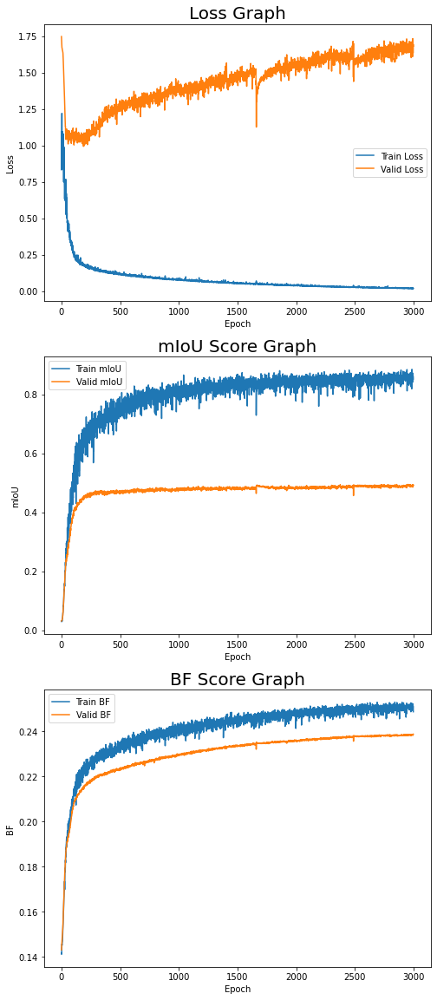

In [20]:
# check losses and miou scores graph
fig, ax = plt.subplots(3,1, figsize=(8,20))
ax[0].set_title('Loss Graph', fontsize=20)
ax[0].plot(np.arange(len(train_loss)), train_loss, label='Train Loss')
ax[0].plot(np.arange(len(valid_loss)), valid_loss, label='Valid Loss')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Loss')
ax[0].legend(loc='best')
ax[1].set_title('mIoU Score Graph', fontsize=20)
ax[1].plot(np.arange(len(train_miou)), train_miou, label='Train mIoU')
ax[1].plot(np.arange(len(valid_miou)), valid_miou, label='Valid mIoU')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('mIoU')
ax[1].legend(loc='best')
ax[2].set_title('BF Score Graph', fontsize=20)
ax[2].plot(np.arange(len(train_bf)), train_bf, label='Train BF')
ax[2].plot(np.arange(len(valid_bf)), valid_bf, label='Valid BF')
ax[2].set_xlabel('Epoch')
ax[2].set_ylabel('BF')
ax[2].legend(loc='best')
fig.show()

# Test (마지막까지 훈련한 모델)

In [21]:
# load test data
test_loader = DataLoader(
    CamVidDataset(transforms_, subset='test'),
    batch_size=len(test_image),
    drop_last=True,
    shuffle=False
)

In [22]:
# test
with torch.no_grad():
    for test_images, test_labels in test_loader:
        test_images = test_images.to(device)
        test_labels = test_labels.to(device)
        # predict
        test_outputs = model(test_images)
        loss = loss_func(test_outputs, test_labels)
        test_miou = metric.get_miou(test_outputs, test_labels)
        test_bf = metric.get_f1_score(test_outputs, test_labels)
        print(f'Test Loss: {loss.item():.3f},'
              f'  Test mIoU: {test_miou:.3f},'
              f'  Test BF: {test_bf:.3f}')

Test Loss: 0.833,  Test mIoU: 0.430,  Test BF: 0.231


In [23]:
# 12 classes channels to 3 RGB channels
def map_class_to_rgb(p):
    return rgb_array[p[0]]

def mask2rgb(images):
    rgb_img_list = []
    for img in tqdm(images):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1,2,0))
        img = np.argmax(img, axis=-1)
        rgb_img = np.apply_along_axis(map_class_to_rgb, -1, np.expand_dims(img, -1))
        rgb_img_list.append(rgb_img)
    return np.array(rgb_img_list)

test_result = mask2rgb(test_outputs)

  0%|          | 0/233 [00:00<?, ?it/s]

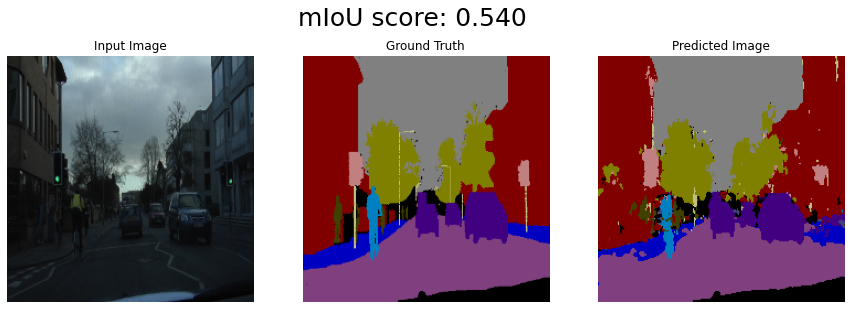

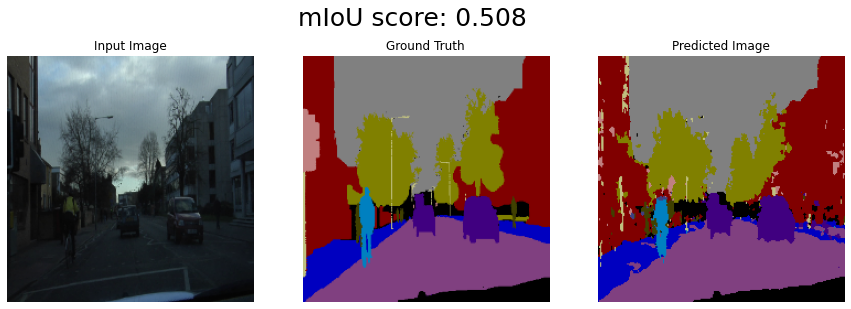

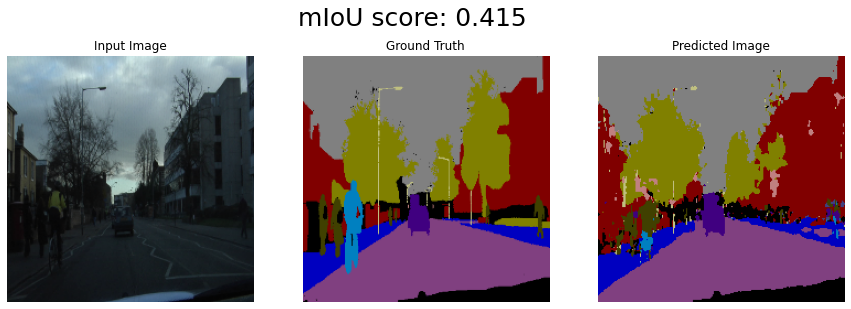

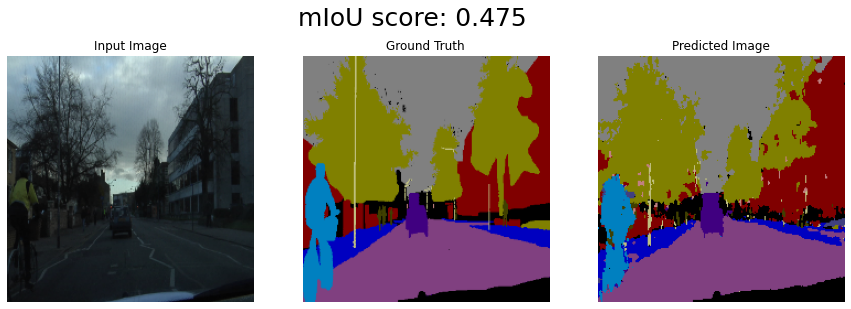

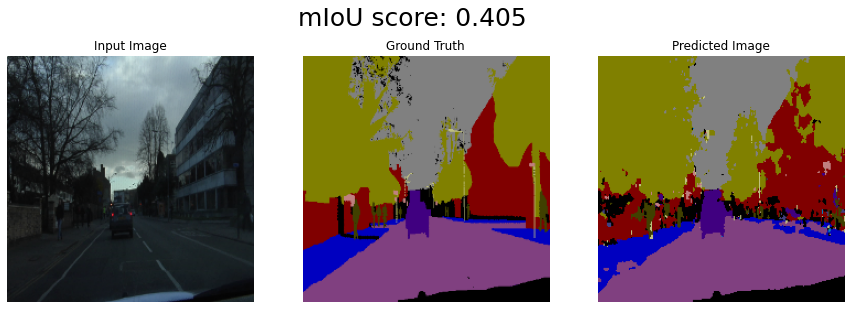

...

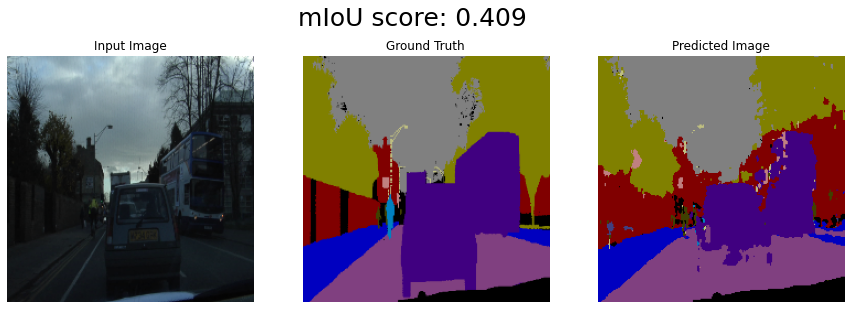

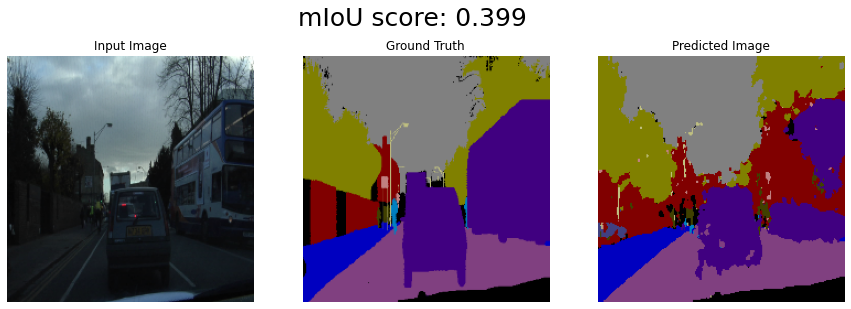

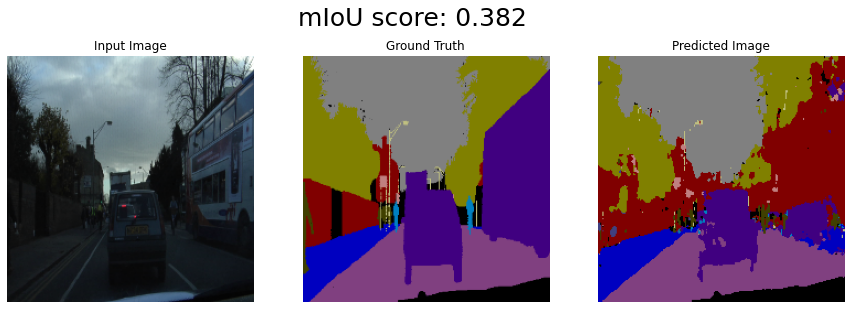

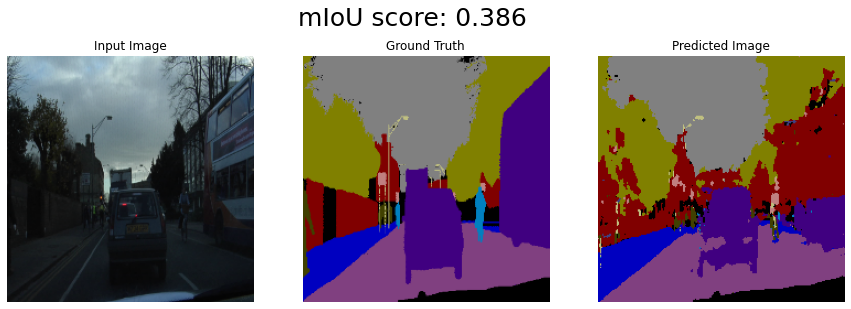

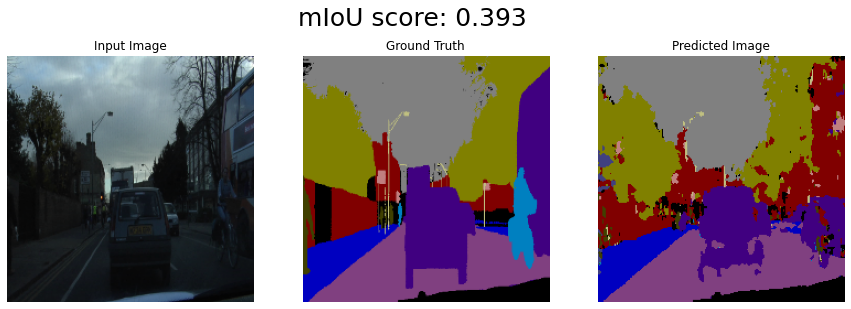

In [24]:
# show test outputs with miou score
test_metric = Metrics(n_classes=num_classes, dim=0)

def show_result(image, label, mask, model_pred, rgb_pred, ncols):
    for i in range(ncols):
        # get miou score
        miou = test_metric.get_miou(mask[i], model_pred[i])
        # plot images
        fig, ax = plt.subplots(1,3, figsize=(15,5))
        fig.suptitle(f'mIoU score: {miou:.3f}', fontsize=25)
        ax[0].imshow(image[i])
        ax[0].axis('off')
        ax[0].set_title('Input Image')
        ax[1].imshow(label[i])
        ax[1].axis('off')
        ax[1].set_title(f'Ground Truth')
        ax[2].imshow(rgb_pred[i])
        ax[2].axis('off')
        ax[2].set_title(f'Predicted Image')
        fig.show()

show_result(test_image, test_label, test_labels, test_outputs, test_result, 20)

In [25]:
# model이 train data에 대해 잘 훈련됐는지 확인
train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train', predict_train=True),
    batch_size=100,
    shuffle=False,
    drop_last=True
)

In [26]:
# test
with torch.no_grad():
    for train_images, train_labels in train_loader:
        train_images = train_images.to(device)
        train_labels = train_labels.to(device)
        # predict
        train_outputs = model(train_images)
        loss = loss_func(train_outputs, train_labels)
        train_miou = metric.get_miou(train_outputs, train_labels)
        train_bf = metric.get_f1_score(train_outputs, train_labels)
        print(f'Train Loss: {loss.item():.3f},'
              f'  Train mIoU: {train_miou:.3f},'
              f'  Train BF: {train_bf:.3f}')
        
train_result = mask2rgb(train_outputs)

Train Loss: 0.020,  Train mIoU: 0.863,  Train BF: 0.251


  0%|          | 0/100 [00:00<?, ?it/s]

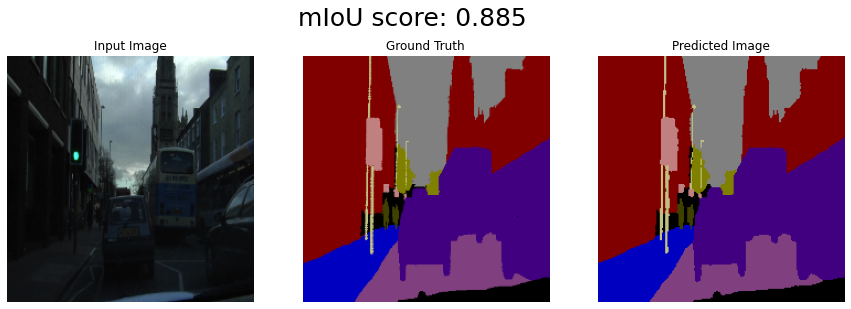

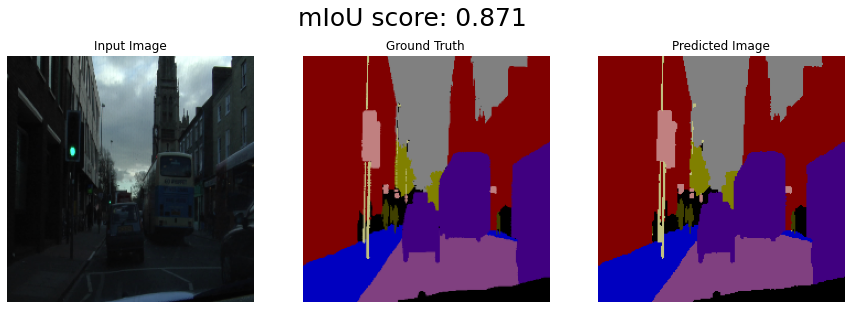

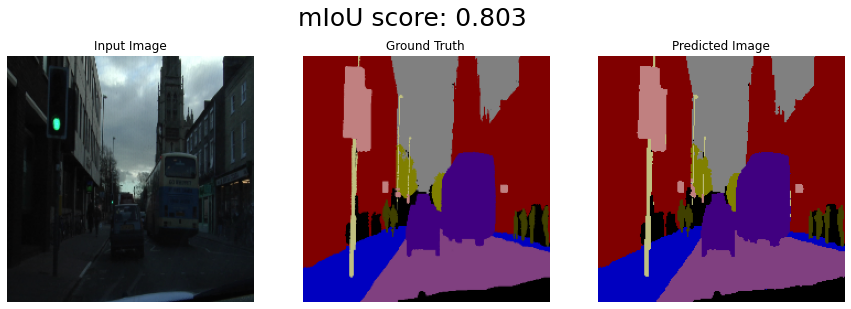

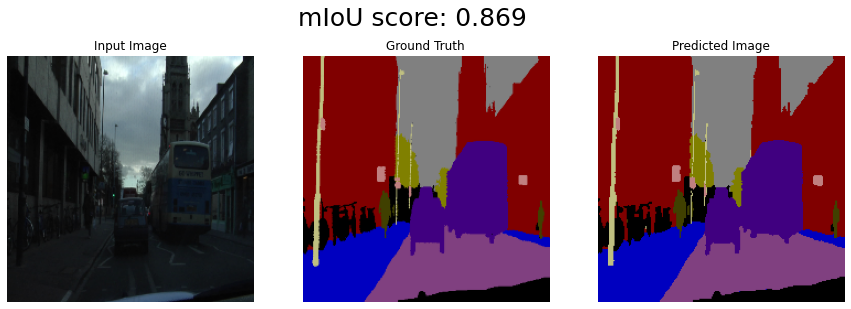

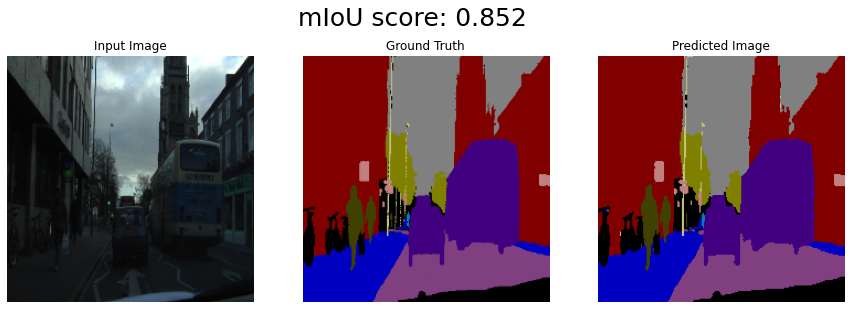

...

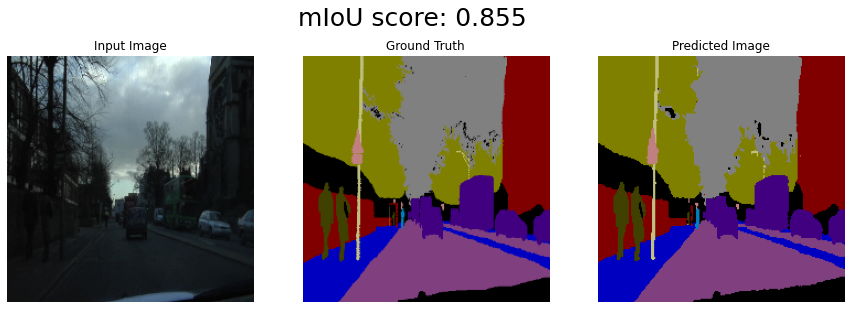

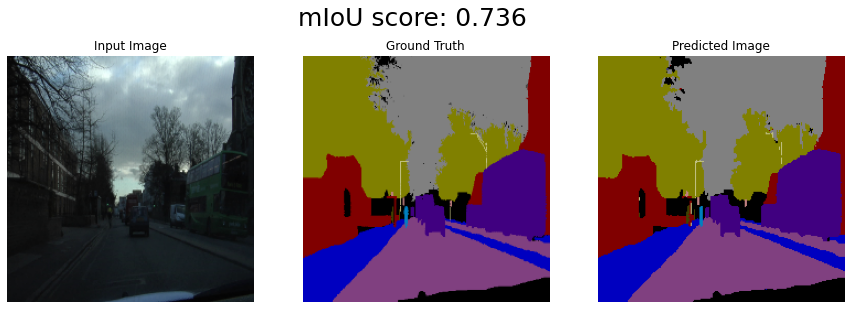

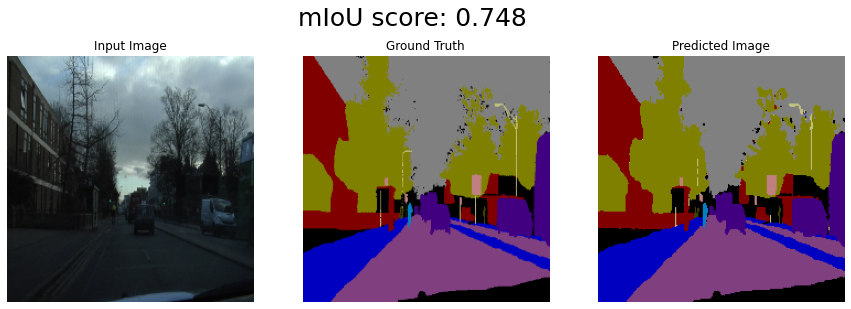

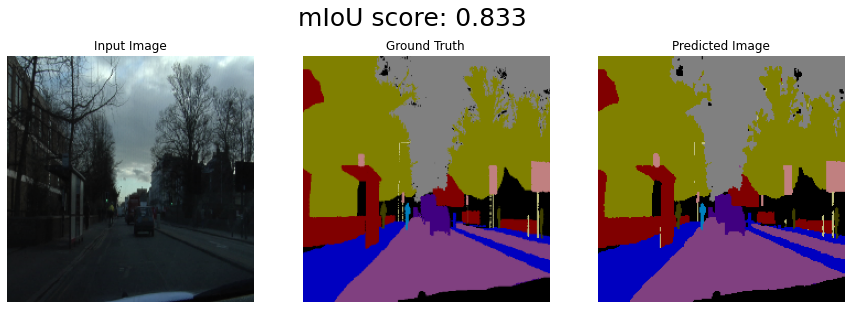

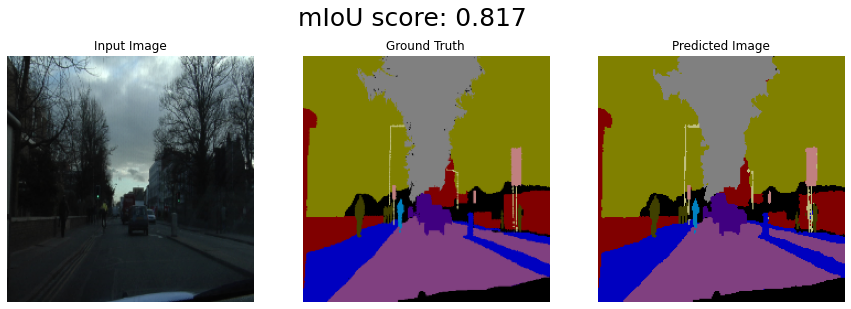

In [27]:
show_result(train_image, train_label, train_labels, train_outputs, train_result, 20)

# checkpoint 저장 모델

In [28]:
# load saved model
model = SegNet().to(device)
model.load_state_dict(torch.load('./model/cp_checkpoint.pt'))

<All keys matched successfully>

In [29]:
# load test data
test_loader = DataLoader(
    CamVidDataset(transforms_, subset='test'),
    batch_size=len(test_image),
    drop_last=True,
    shuffle=False
)

In [30]:
# test
with torch.no_grad():
    for test_images, test_labels in test_loader:
        test_images = test_images.to(device)
        test_labels = test_labels.to(device)
        # predict
        test_outputs = model(test_images)
        loss = loss_func(test_outputs, test_labels)
        test_miou = metric.get_miou(test_outputs, test_labels)
        test_bf = metric.get_f1_score(test_outputs, test_labels)
        print(f'Test Loss: {loss.item():.3f},'
              f'  Test mIoU: {test_miou:.3f},'
              f'  Test BF: {test_bf:.3f}')

Test Loss: 0.650,  Test mIoU: 0.385,  Test BF: 0.208


In [31]:
test_result = mask2rgb(test_outputs)

  0%|          | 0/233 [00:00<?, ?it/s]

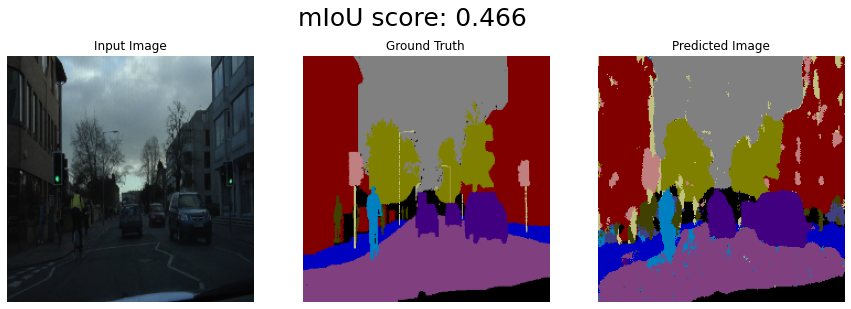

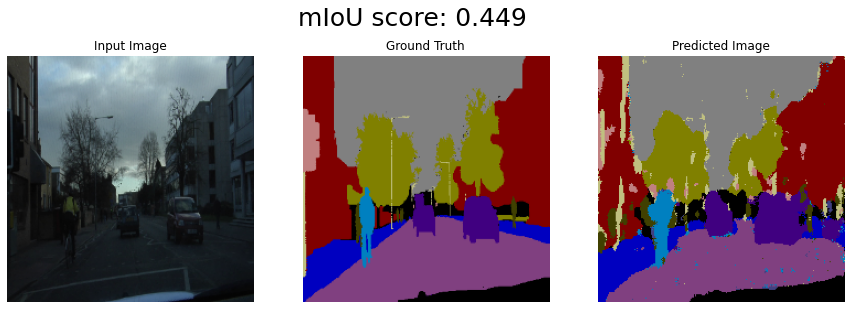

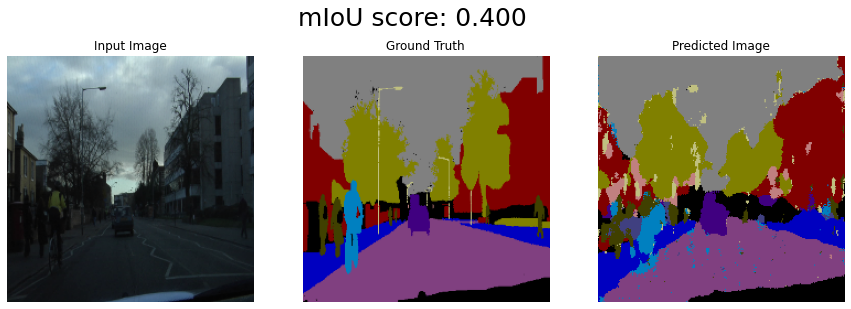

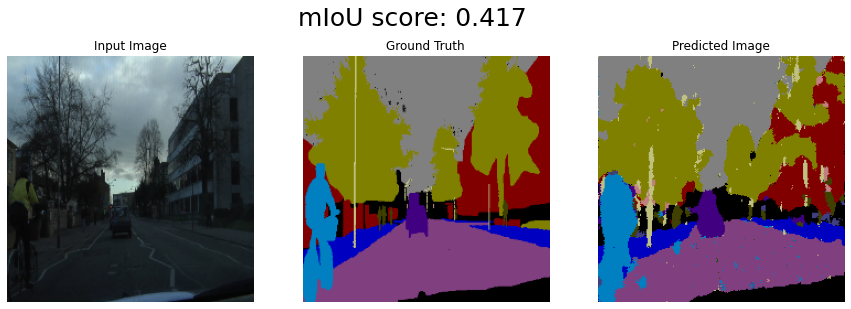

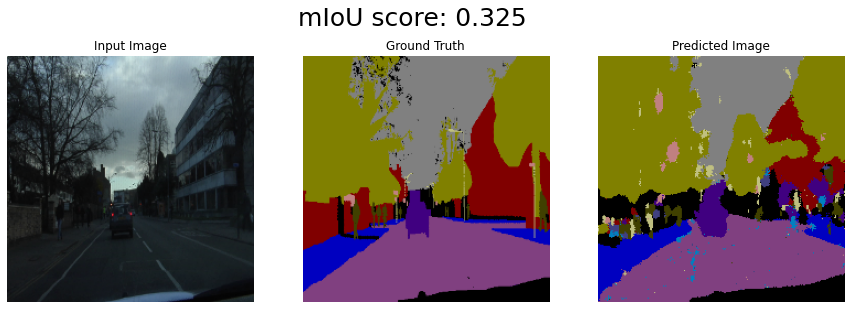

...

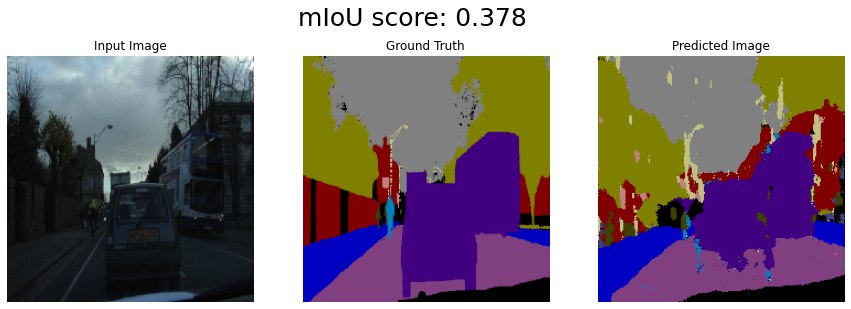

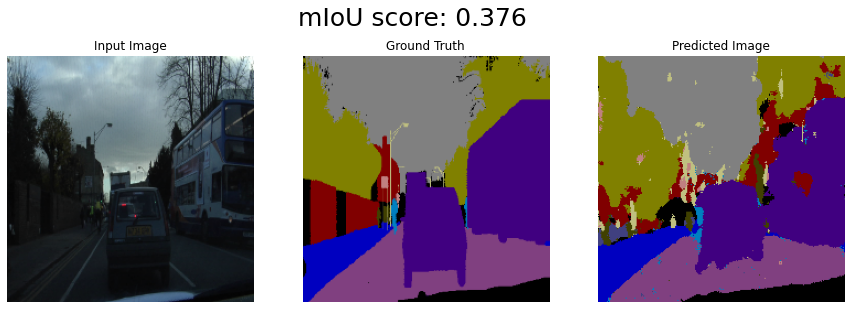

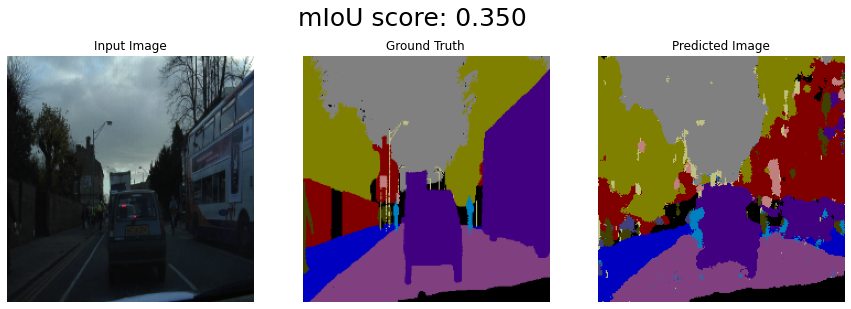

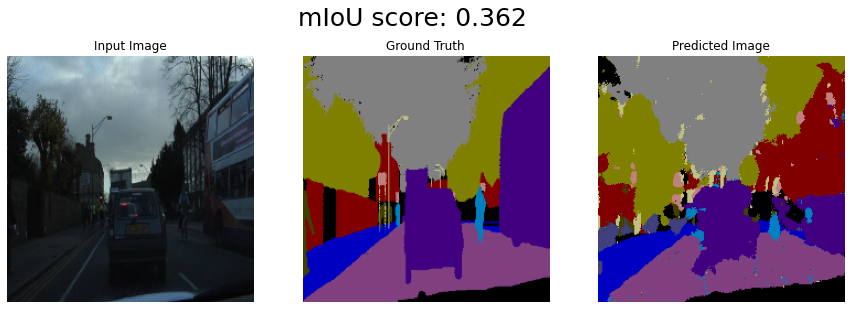

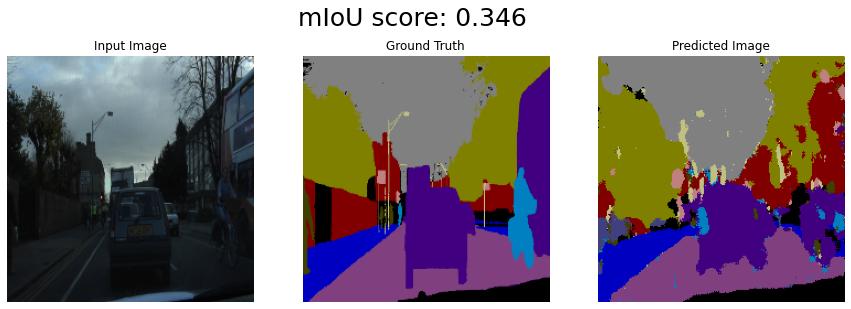

In [32]:
show_result(test_image, test_label, test_labels, test_outputs, test_result, 20)

In [33]:
# model이 train data에 대해 잘 훈련됐는지 확인
train_loader = DataLoader(
    CamVidDataset(transforms_=transforms_, subset='train', predict_train=True),
    batch_size=100,
    shuffle=False,
    drop_last=True
)

In [34]:
# test
with torch.no_grad():
    for train_images, train_labels in train_loader:
        train_images = train_images.to(device)
        train_labels = train_labels.to(device)
        # predict
        train_outputs = model(train_images)
        loss = loss_func(train_outputs, train_labels)
        train_miou = metric.get_miou(train_outputs, train_labels)
        train_bf = metric.get_f1_score(train_outputs, train_labels)
        print(f'Train Loss: {loss.item():.3f},'
              f'  Train mIoU: {train_miou:.3f},'
              f'  Train BF: {train_bf:.3f}')
        
train_result = mask2rgb(train_outputs)

Train Loss: 0.218,  Train mIoU: 0.631,  Train BF: 0.223


  0%|          | 0/100 [00:00<?, ?it/s]

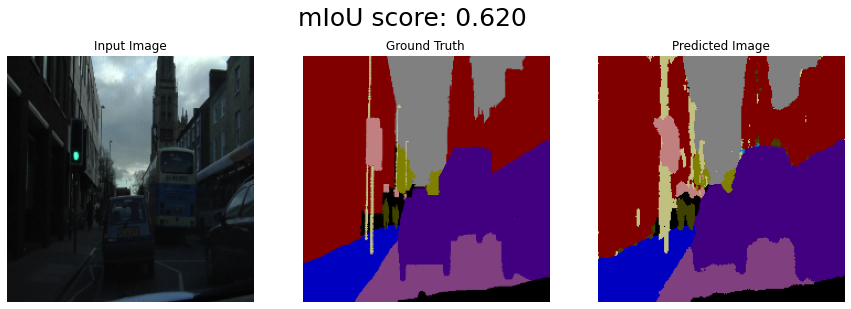

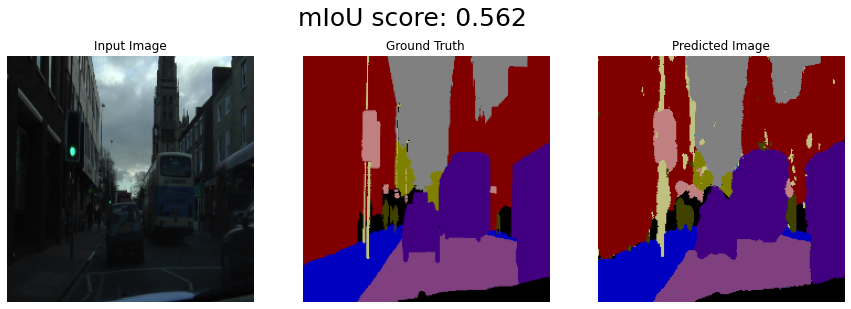

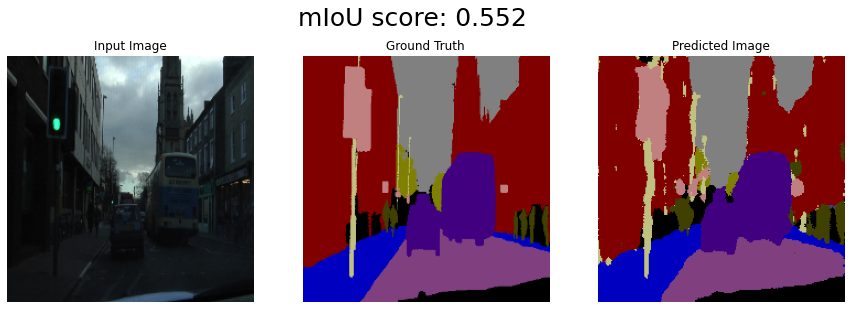

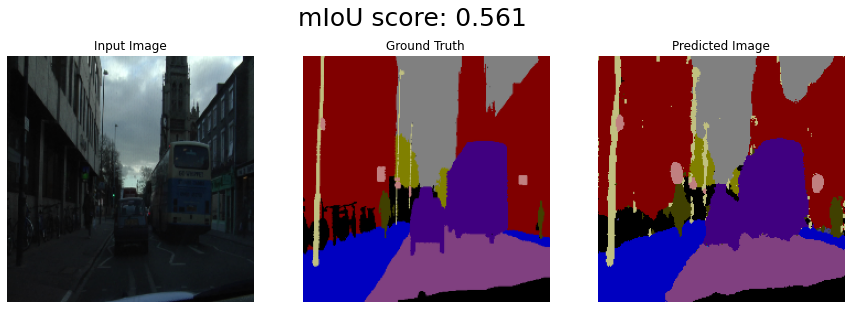

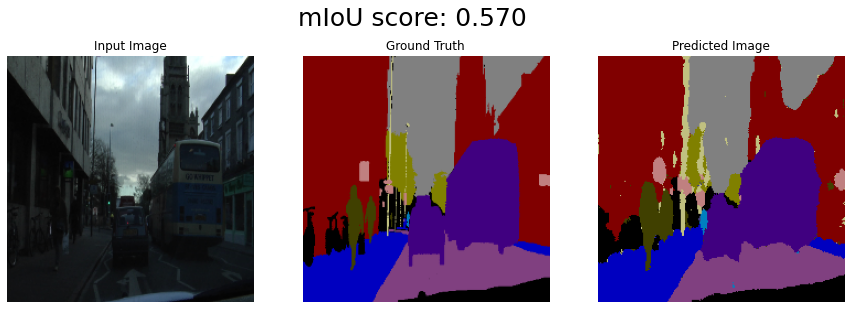

...

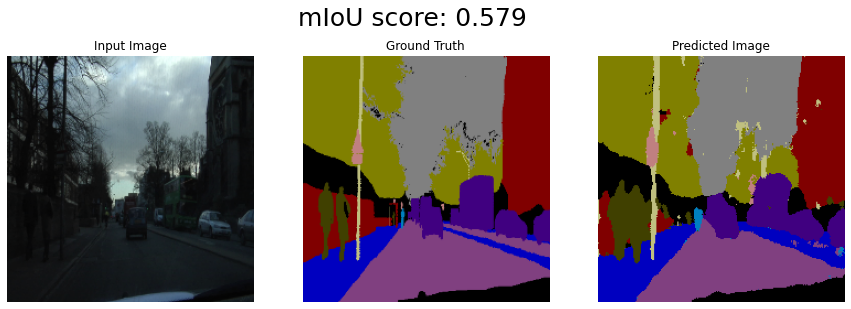

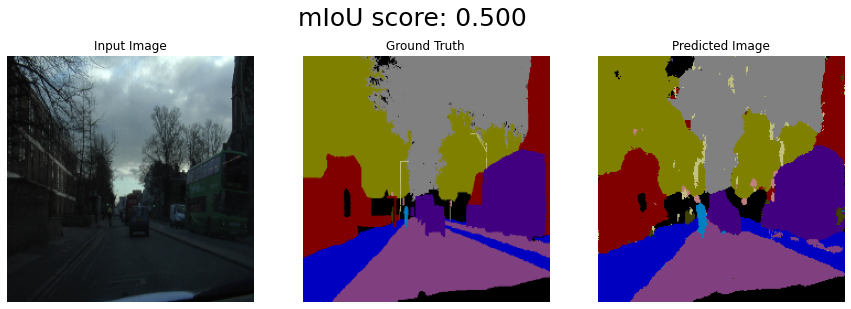

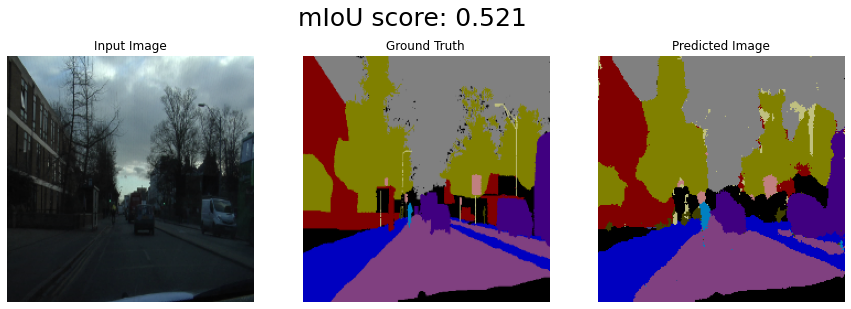

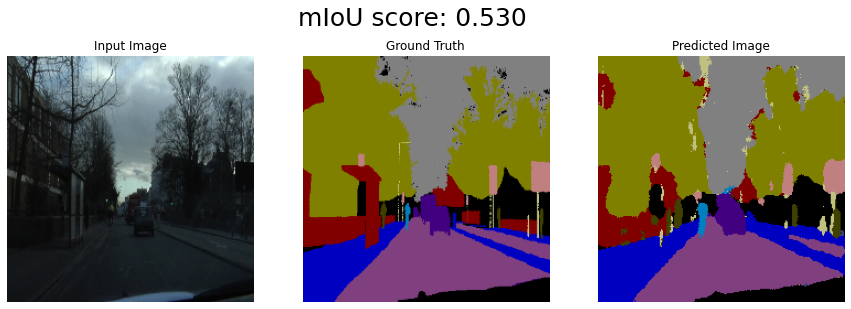

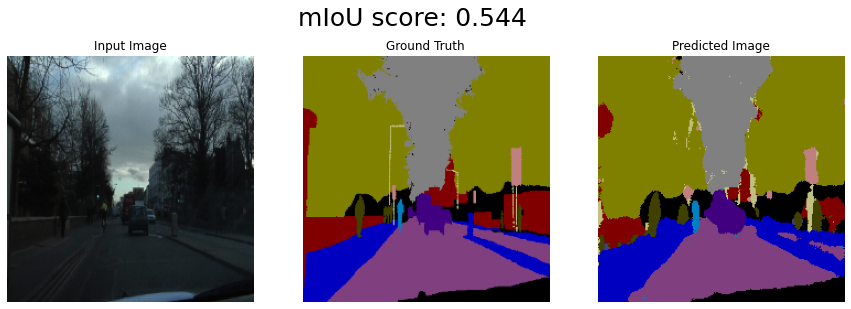

In [35]:
show_result(train_image, train_label, train_labels, train_outputs, train_result, 20)